In [1]:
from transformers import AutoProcessor, Pix2StructForConditionalGeneration, Seq2SeqTrainer, Seq2SeqTrainingArguments
from torch.utils.data import Dataset, DataLoader, random_split
from datasets import Dataset as HFDataset
from PIL import Image
import json
import os
from tqdm import tqdm
import torch
import os

# Set CUDA environment variable to avoid memory fragmentation
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

class ChartDataset(Dataset):
    def __init__(self, images_dir, annotations_dir, processor):
        self.images_dir = images_dir
        self.annotations_dir = annotations_dir
        self.processor = processor
        self.image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_file = self.image_files[idx]
        annotation_file = image_file.replace('.jpg', '.json')

        # Load image
        image_path = os.path.join(self.images_dir, image_file)
        image = Image.open(image_path).convert("RGB")

        # Load annotation
        annotation_path = os.path.join(self.annotations_dir, annotation_file)
        with open(annotation_path, 'r') as f:
            annotation = json.load(f)

        # Extract data-series from annotation
        data_series = annotation.get("data-series", [])

        # Preprocess the image with the text "Generate data series"
        inputs = self.processor(images=image, text="Generate data series:", return_tensors="pt")

        return {
            "flattened_patches": inputs["flattened_patches"].squeeze(),
            "labels": torch.tensor(self.processor.tokenizer(json.dumps(data_series), padding="max_length", max_length=512, truncation=True).input_ids)  # Reduced max_length
        }

# Custom data collator
def custom_data_collator(features):
    flattened_patches = torch.stack([feature["flattened_patches"] for feature in features])
    labels = torch.nn.utils.rnn.pad_sequence([feature["labels"] for feature in features], batch_first=True, padding_value=-100)
    return {"flattened_patches": flattened_patches, "labels": labels}

# Paths to your data directories
images_dir = "/kaggle/input/sortrd-chart-data/sorted_data/sorted_data/dot/images"
annotations_dir = "/kaggle/input/sortrd-chart-data/sorted_data/sorted_data/dot/annotations"

# Load processor and model
model = Pix2StructForConditionalGeneration.from_pretrained("google/deplot")
processor = AutoProcessor.from_pretrained("google/deplot")

# Prepare dataset
dataset = ChartDataset(images_dir, annotations_dir, processor)

# Split dataset into training and evaluation
train_size = int(0.8 * len(dataset))
eval_size = len(dataset) - train_size
train_dataset, eval_dataset = random_split(dataset, [train_size, eval_size])

# Use DataLoader for lazy loading and batching
data_loader = DataLoader(dataset, batch_size=4, shuffle=True, num_workers=4)

config.json:   0%|          | 0.00/4.88k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.13G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/249 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.62k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/851k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

In [2]:
# Training arguments
training_args = Seq2SeqTrainingArguments(
    output_dir="/kaggle/working/deplot_finetuned",
    eval_strategy="epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=1,  # Further reduced batch size
    per_device_eval_batch_size=1,  # Further reduced batch size
    num_train_epochs=5,
    save_strategy="epoch",
    save_total_limit=2,
    predict_with_generate=True,
    fp16=True,
    logging_dir="/kaggle/working/logs",
    logging_steps=100,
    push_to_hub=False,
    dataloader_num_workers=2,  # Reduced workers
    ddp_find_unused_parameters=False,
    report_to=["none"],
    gradient_accumulation_steps=2,  # Reduced gradient accumulation
    no_cuda=False,
    load_best_model_at_end=True
)

In [3]:
# Initialize trainer
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,  # Training dataset
    eval_dataset=eval_dataset,    # Evaluation dataset
    tokenizer=processor.tokenizer,
    data_collator=custom_data_collator
)

# Train model
trainer.train()

# Save the model
model.save_pretrained("/kaggle/working/deplot_dot_finetuned")
processor.save_pretrained("/kaggle/working/deplot_dot_finetuned")

<ipython-input-3-2a40b2f33621>:2: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(
Legacy behavior is being used. The current behavior will be deprecated in version 5.0.0. In the new behavior, If both images and text are provided, image_processor is not a VQA processor, and `add_special_tokens` is unset, the default value of `add_special_tokens` will be changed to `False` when calling the tokenizer. To test the new behavior, set `legacy=False`as a processor call argument.
Legacy behavior is being used. The current behavior will be deprecated in version 5.0.0. In the new behavior, If both images and text are provided, image_processor is not a VQA processor, and `add_special_tokens` is unset, the default value of `add_special_tokens` will be changed to `False` when calling the tokenizer. To test the new behavior, set `legacy=False`as a processor call argument.


Arial.TTF:   0%|          | 0.00/276k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(


Epoch,Training Loss,Validation Loss
1,0.022300,0.014566
2,0.003100,0.004448
3,0.004000,0.004205
4,0.003300,0.004500
5,0.002500,0.004617


Legacy behavior is being used. The current behavior will be deprecated in version 5.0.0. In the new behavior, If both images and text are provided, image_processor is not a VQA processor, and `add_special_tokens` is unset, the default value of `add_special_tokens` will be changed to `False` when calling the tokenizer. To test the new behavior, set `legacy=False`as a processor call argument.
Legacy behavior is being used. The current behavior will be deprecated in version 5.0.0. In the new behavior, If both images and text are provided, image_processor is not a VQA processor, and `add_special_tokens` is unset, the default value of `add_special_tokens` will be changed to `False` when calling the tokenizer. To test the new behavior, set `legacy=False`as a processor call argument.
Legacy behavior is being used. The current behavior will be deprecated in version 5.0.0. In the new behavior, If both images and text are provided, image_processor is not a VQA processor, and `add_special_tokens`

[]

In [4]:
from torch.utils.data import Dataset, DataLoader, random_split
import pandas as pd
import json
import os
import torch
from transformers import AutoProcessor, Pix2StructForConditionalGeneration
from PIL import Image


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the fine-tuned model and processor
model = Pix2StructForConditionalGeneration.from_pretrained("/kaggle/working/deplot_dot_finetuned").to(device)
processor = AutoProcessor.from_pretrained("/kaggle/working/deplot_dot_finetuned")

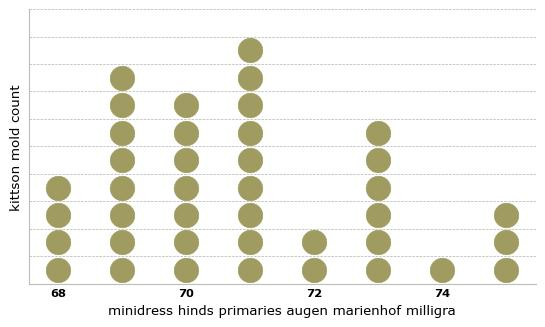

Legacy behavior is being used. The current behavior will be deprecated in version 5.0.0. In the new behavior, If both images and text are provided, image_processor is not a VQA processor, and `add_special_tokens` is unset, the default value of `add_special_tokens` will be changed to `False` when calling the tokenizer. To test the new behavior, set `legacy=False`as a processor call argument.


[{"x": "68", "y": 7}, {"x": "69", "y": 9}, {"x": "69", "y": 9}, {"x": "69", "y": 9}, {"x": "69", "y": 9}, {"x": "69", "y": 9}, {"x": "69", "y": 9}]


In [5]:
# Load an example image for prediction
image_path = "/kaggle/input/benetech-extra-generated-data/graphs_d/84359.jpg"
image = Image.open(image_path)
display(image)

inputs = processor(images=image, text="Generate data series:", return_tensors="pt")

# Move inputs to GPU
inputs = {key: value.to(device) for key, value in inputs.items()}

predictions = model.generate(**inputs, max_new_tokens=2048)
print(processor.decode(predictions[0], skip_special_tokens=True))

start loop:


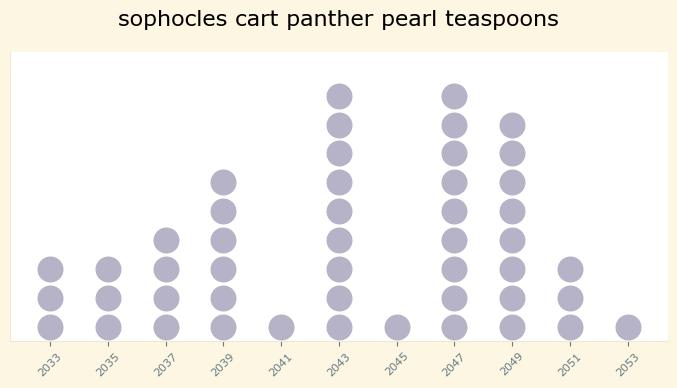

[{"x": "2033", "y": 2}, {"x": "2035", "y": 2}, {"x": "2037", "y": 2}, {"x": "2039", "y": 2}, {"x": "2041", "y": 2}, {"x": "2042", "y": 3}, {"x": "2045", "y": 2}, {"x": "2047", "y": 3}, {"x": "2048", "y": 3}, {"x": "2051", "y": 2}, {"x": "2052", "y": 2}]


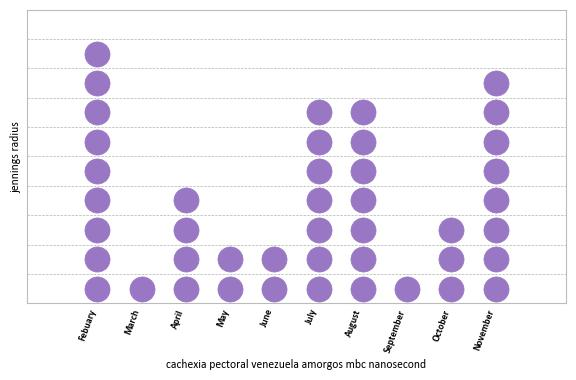

[{"x": "Kenya", "y": 19}, {"x": "Maced", "y": 1}, {"x": "Mexico", "y": 2}, {"x": "Kyrgyzstan", "y": 2}, {"x": "Japan", "y": 2}, {"x": "Argentina", "y": 2}, {"x": "Switzerland", "y": 2}, {"x": "Honduras", "y": 2}, {"x": "Kazakhstan", "y": 2}, {"x": "Switzerland", "y": 2}, {"x": "Monster", "y": 19}]


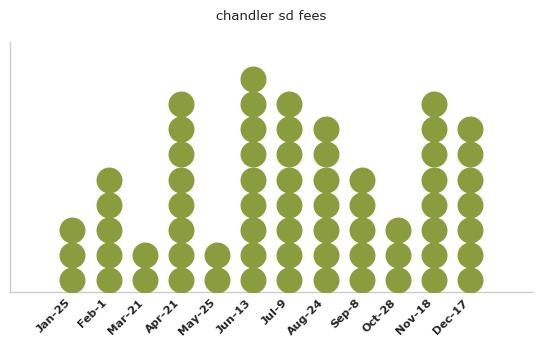

[{"x": "Jan-25", "y": 2}, {"x": "Feb-1", "y": 2}, {"x": "Mar-21", "y": 2}, {"x": "Mar-21", "y": 2}, {"x": "May-25", "y": 2}, {"x": "Jun-13", "y": 9}, {"x": "Aug-24", "y": 9}, {"x": "Sep-8", "y": 2}, {"x": "Oct-28", "y": 2}, {"x": "Nov-18", "y": 9}, {"x": "Dec-17", "y": 9}]


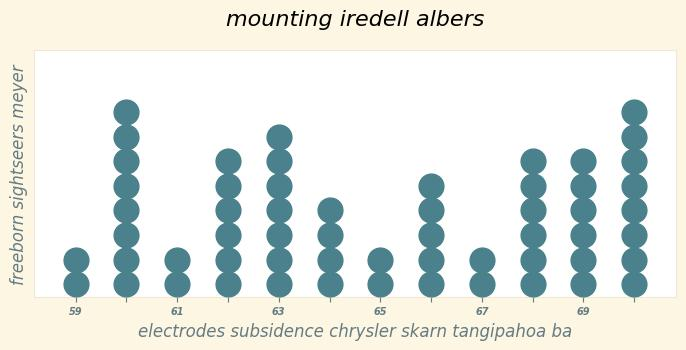

[{"x": "59", "y": 5}, {"x": "61", "y": 5}, {"x": "63", "y": 6}, {"x": "65", "y": 5}, {"x": "67", "y": 5}, {"x": "69", "y": 69}]


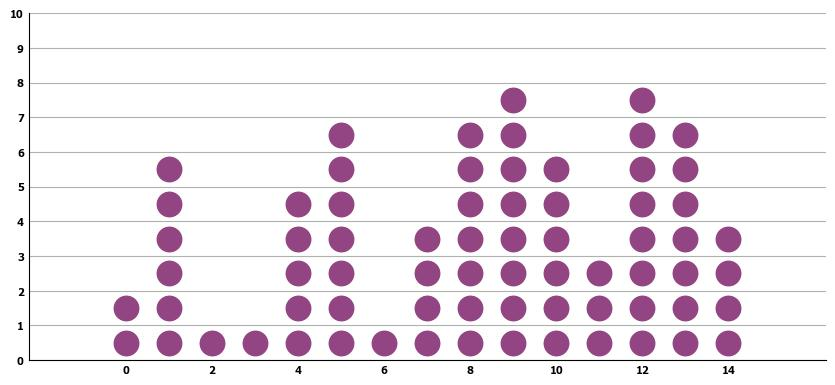

[{"x": "0", "y": 2}, {"x": "2", "y": 1}, {"x": "4", "y": 5}, {"x": "6", "y": 4}, {"x": "8", "y": 7}, {"x": "10", "y": 6}, {"x": "12", "y": 8}, {"x": "14", "y": 4}]


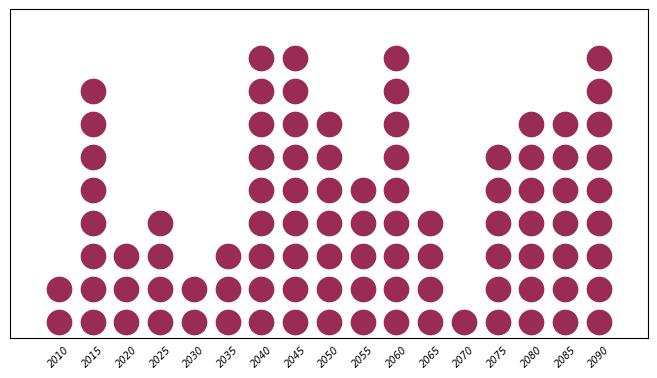

[{"x": "2010", "y": 19}, {"x": "2015", "y": 19}, {"x": "2025", "y": 19}, {"x": "2030", "y": 19}, {"x": "2035", "y": 19}, {"x": "2045", "y": 19}, {"x": "2050", "y": 19}, {"x": "2060", "y": 19}, {"x": "2065", "y": 19}, {"x": "2075", "y": 19}, {"x": "2080", "y": 19}, {"x": "2090", "y": 19}]


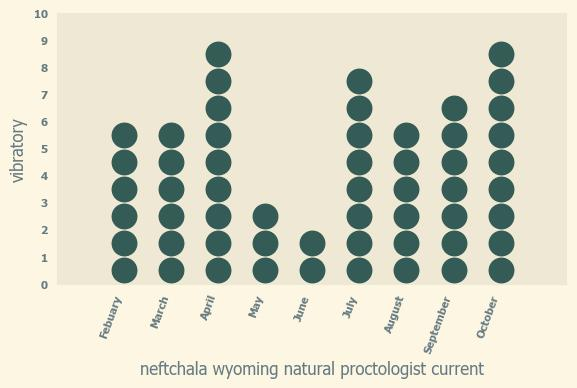

[{"x": "February", "y": 6}, {"x": "March", "y": 6}, {"x": "April", "y": 9}, {"x": "May", "y": 3}, {"x": "June", "y": 2}, {"x": "August", "y": 8}, {"x": "September", "y": 7}, {"x": "October", "y": 9}]


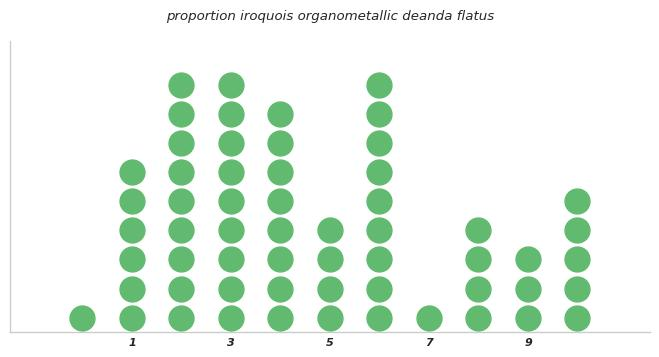

[{"x": "1", "y": 1}, {"x": "3", "y": 3}, {"x": "5", "y": 5}, {"x": "7", "y": 3}, {"x": "9", "y": 3}]


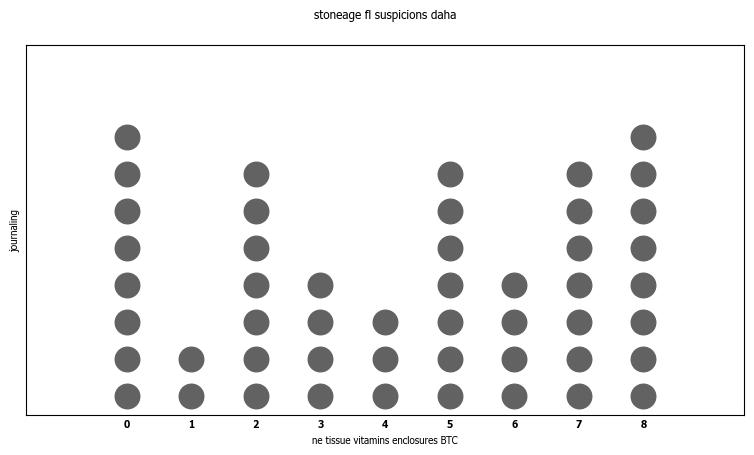

[{"x": "0", "y": 15}, {"x": "1", "y": 1}, {"x": "2", "y": 15}, {"x": "3", "y": 15}, {"x": "4", "y": 15}, {"x": "5", "y": 15}, {"x": "6", "y": 15}, {"x": "7", "y": 15}, {"x": "8", "y": 15}]


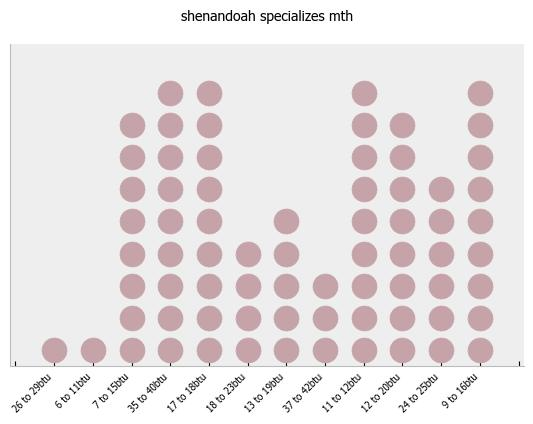

[{"x": "27 to 28 Bu", "y": 2}, {"x": "6 to 11 Bu", "y": 2}, {"x": "7 to 40 Bu", "y": 4}, {"x": "17 to 18 Bu", "y": 4}, {"x": "18 to 28 Bu", "y": 2}, {"x": "17 to 18 Bu", "y": 2}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 to 18 Bu", "y": 4}, {"x": "12 t

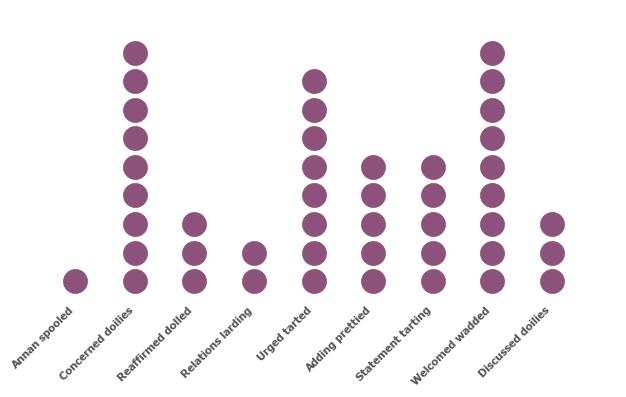

[{"x": "Annual reported", "y": 1}, {"x": "Coorcined doilies", "y": 10}, {"x": "Kkeaffinned doilies", "y": 10}, {"x": "Recently", "y": 10}, {"x": "Unpaid tertiary", "y": 10}, {"x": "Adding pretted", "y": 10}, {"x": "Stakement tertiary", "y": 10}, {"x": "Welcomed wadbed", "y": 10}, {"x": "Diccused doilies", "y": 10}]


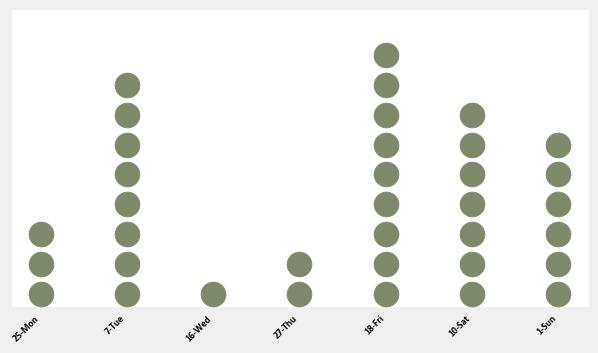

[{"x": "2-Men", "y": 2}, {"x": "Blue", "y": 2}, {"x": "Blue", "y": 2}, {"x": "Blue", "y": 2}, {"x": "Blue", "y": 2}, {"x": "1-Op", "y": 2}]


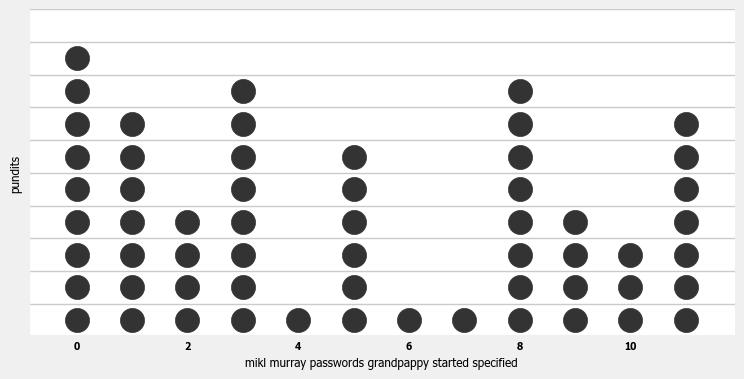

[{"x": "0", "y": 11}, {"x": "2", "y": 11}, {"x": "4", "y": 11}, {"x": "6", "y": 2}, {"x": "8", "y": 11}, {"x": "10", "y": 10}]


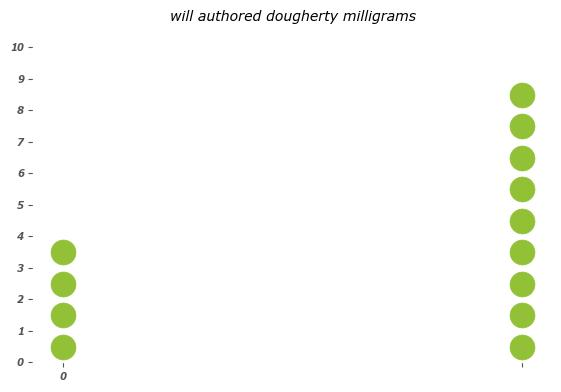

[{"x": "0", "y": 4}, {"x": "0", "y": 9}]


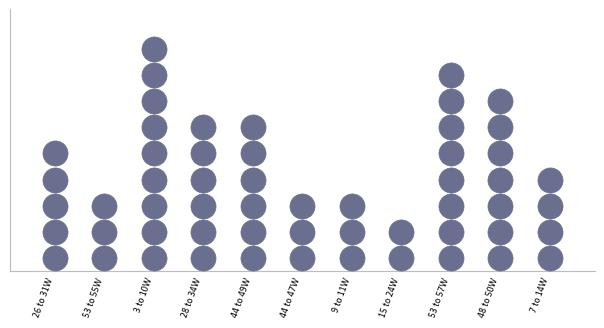

[{"x": "16 to 300", "y": 3}, {"x": "3 to 100", "y": 9}, {"x": "20 to 200", "y": 9}, {"x": "40 to 200", "y": 9}, {"x": "5 to 200", "y": 9}, {"x": "5 to 200", "y": 9}, {"x": "7 to 400", "y": 9}]


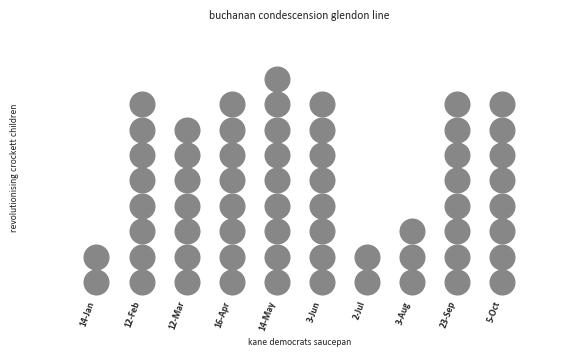

[{"x": "Ad-bin", "y": 1}, {"x": "12-10", "y": 16}, {"x": "16-10", "y": 16}, {"x": "16-10", "y": 16}, {"x": "16-10", "y": 16}, {"x": "16-10", "y": 16}, {"x": "16-10", "y": 16}, {"x": "16-10", "y": 16}]


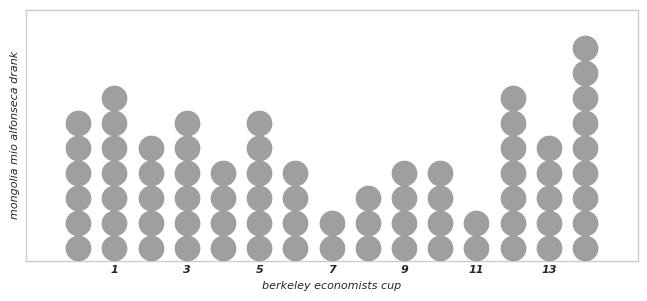

[{"x": "1", "y": 7}, {"x": "3", "y": 7}, {"x": "9", "y": 7}, {"x": "11", "y": 7}, {"x": "13", "y": 13}]


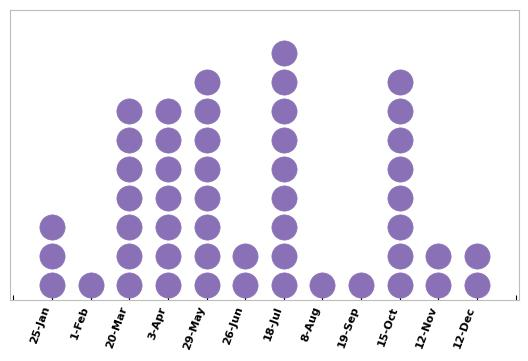

[{"x": "25-10", "y": 2}, {"x": "25-10", "y": 2}, {"x": "25-10", "y": 2}, {"x": "15-10", "y": 2}, {"x": "15-10", "y": 2}, {"x": "12-10", "y": 2}, {"x": "12-10", "y": 2}]


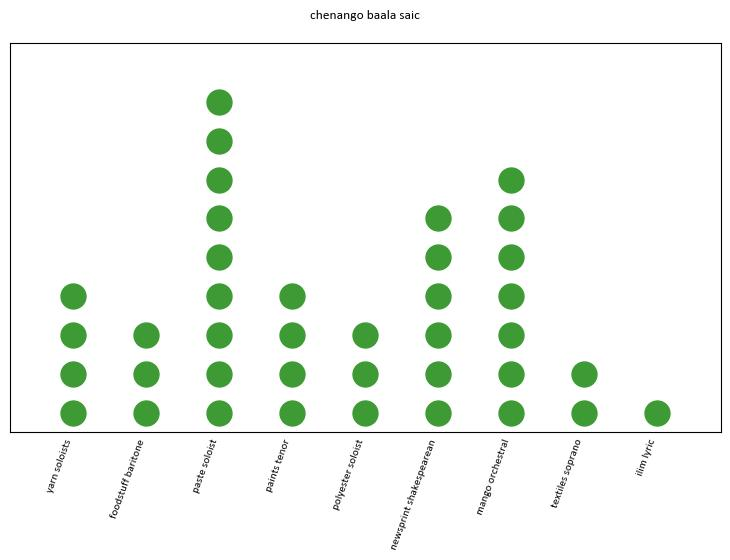

[{"x": "Narrative", "y": 16}, {"x": "Narrative", "y": 16}, {"x": "Narrative", "y": 16}, {"x": "Narrative", "y": 16}, {"x": "Narrative", "y": 16}, {"x": "Narrative", "y": 16}, {"x": "Narrative", "y": 16}, {"x": "Narrative", "y": 16}]


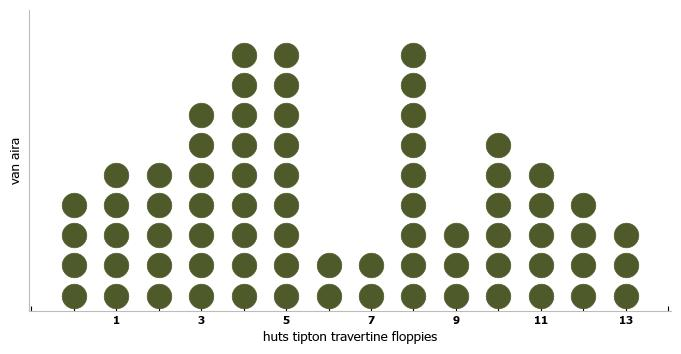

[{"x": "1", "y": 6}, {"x": "3", "y": 6}, {"x": "5", "y": 6}, {"x": "7", "y": 6}, {"x": "9", "y": 6}, {"x": "11", "y": 6}, {"x": "13", "y": 6}]


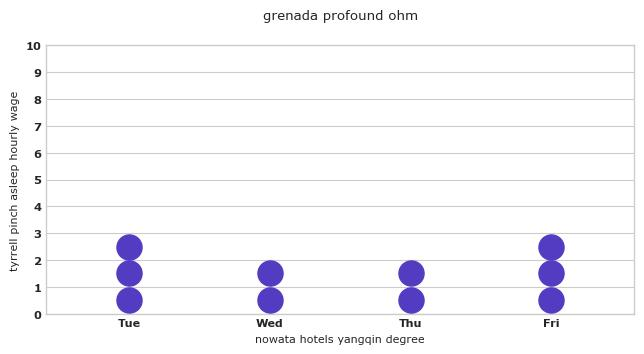

[{"x": "Tue", "y": 3}, {"x": "Wed", "y": 2}, {"x": "Thu", "y": 2}, {"x": "Fri", "y": 3}]


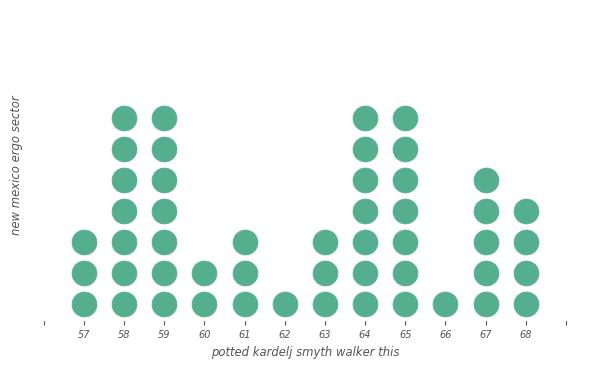

[{"x": "1", "y": 5}, {"x": "58", "y": 6}, {"x": "59", "y": 6}, {"x": "60", "y": 6}, {"x": "61", "y": 6}, {"x": "62", "y": 6}, {"x": "63", "y": 5}, {"x": "64", "y": 6}, {"x": "65", "y": 6}, {"x": "66", "y": 6}, {"x": "67", "y": 6}, {"x": "68", "y": 2}, {"x": "69", "y": 2}, {"x": "60", "y": 2}, {"x": "67", "y": 2}, {"x": "68", "y": 2}]


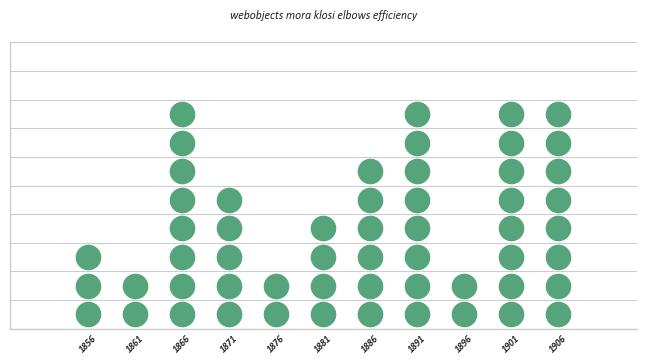

[{"x": "866", "y": 1}, {"x": "867", "y": 1}, {"x": "868", "y": 1}, {"x": "869", "y": 1}, {"x": "870", "y": 1}, {"x": "871", "y": 1}, {"x": "872", "y": 1}, {"x": "873", "y": 13}, {"x": "874", "y": 13}, {"x": "875", "y": 13}, {"x": "876", "y": 13}, {"x": "877", "y": 13}, {"x": "878", "y": 13}, {"x": "879", "y": 13}, {"x": "880", "y": 13}, {"x": "881", "y": 13}, {"x": "882", "y": 13}, {"x": "883", "y": 13}, {"x": "884", "y": 13}, {"x": "885", "y": 13}, {"x": "886", "y": 13}]


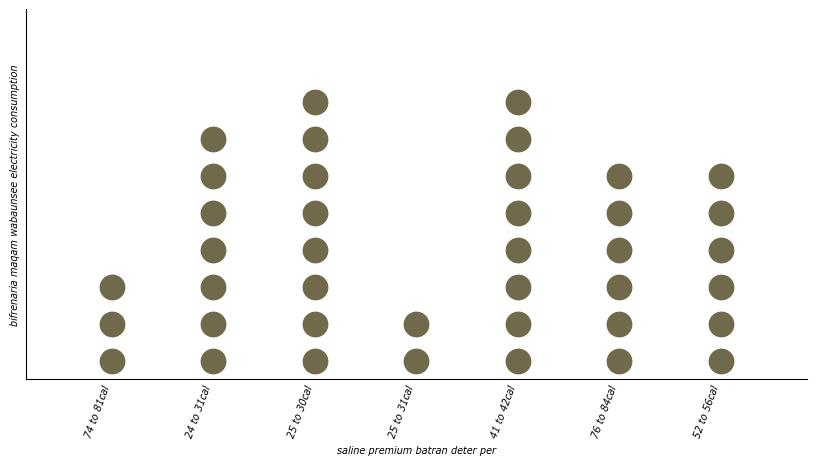

[{"x": "77 to 81", "y": 2}, {"x": "27 to 82", "y": 2}, {"x": "25 to 82", "y": 3}, {"x": "26 to 82", "y": 2}, {"x": "41 to 82", "y": 3}, {"x": "42 to 82", "y": 3}]


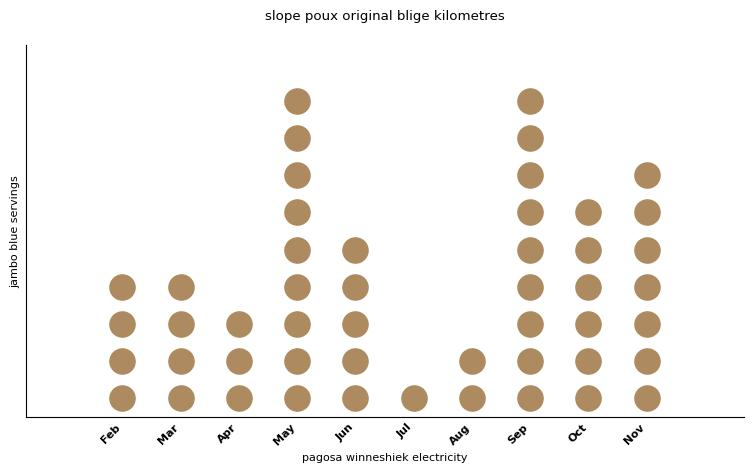

[{"x": "Fro", "y": 3}, {"x": "Mel", "y": 3}, {"x": "Az", "y": 3}, {"x": "May", "y": 17}, {"x": "Jul", "y": 17}, {"x": "Sep", "y": 17}, {"x": "OCH", "y": 17}, {"x": "Nov", "y": 17}]


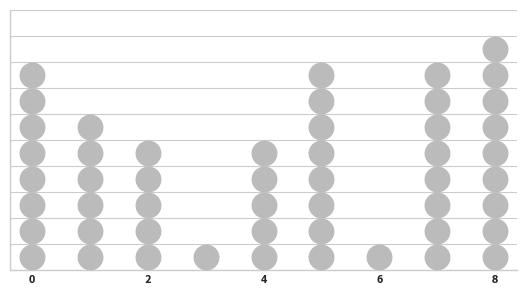

[{"x": "0", "y": 13}, {"x": "2", "y": 13}, {"x": "2", "y": 13}, {"x": "2", "y": 13}, {"x": "2", "y": 13}, {"x": "2", "y": 13}, {"x": "2", "y": 13}, {"x": "2", "y": 13}, {"x": "2", "y": 13}, {"x": "2", "y": 13}]


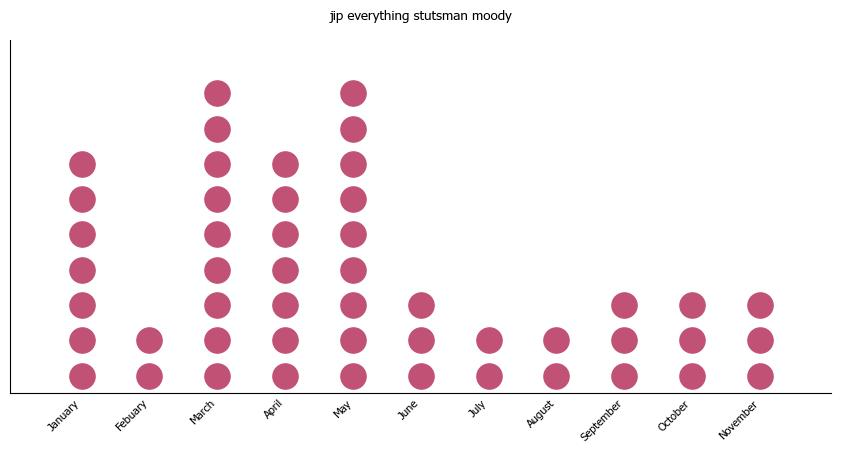

[{"x": "Journey", "y": 16}, {"x": "Ebury", "y": 16}, {"x": "Karm", "y": 16}, {"x": "Achi", "y": 16}, {"x": "Aquis", "y": 16}, {"x": "Solidar", "y": 16}, {"x": "Ocone", "y": 16}, {"x": "Noender", "y": 16}]


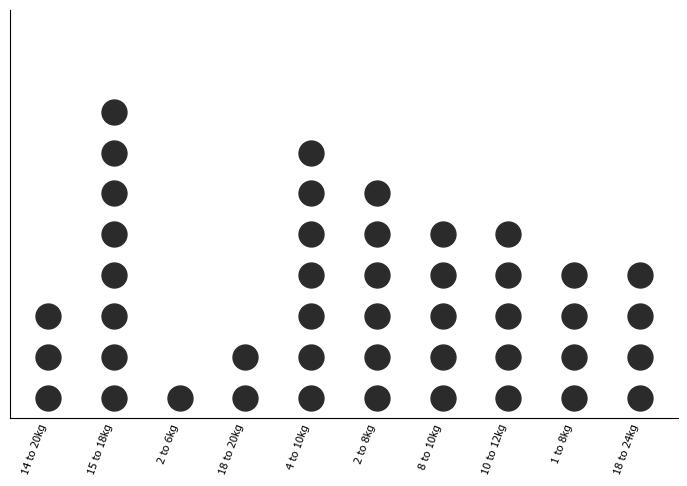

[{"x": "14'to 200", "y": 15}, {"x": "15'to 200", "y": 15}, {"x": "20'to 20", "y": 15}, {"x": "20'to 20", "y": 15}, {"x": "10'to 20", "y": 15}, {"x": "10'to 20", "y": 15}, {"x": "10'to 20", "y": 15}]


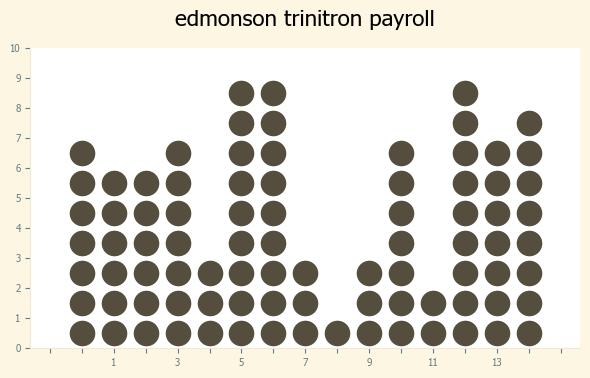

[{"x": "1", "y": 7}, {"x": "3", "y": 7}, {"x": "5", "y": 9}, {"x": "7", "y": 7}, {"x": "9", "y": 3}, {"x": "11", "y": 1}, {"x": "13", "y": 7}]


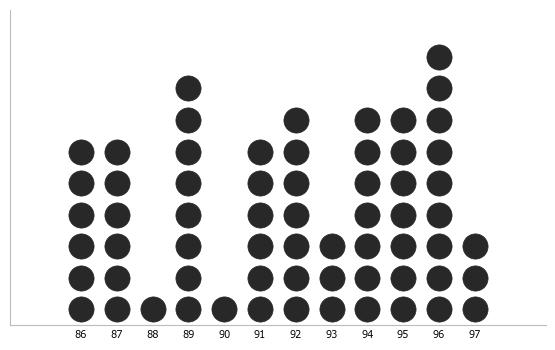

[{"x": "86", "y": 87", "y": 87}, {"x": "86", "y": 89}, {"x": "90", "y": 90}, {"x": "91", "y": 92", "y": 92}, {"x": "93", "y": 93}, {"x": "94", "y": 94}, {"x": "95", "y": 94}, {"x": "96", "y": 98}, {"x": "97", "y": 9}]


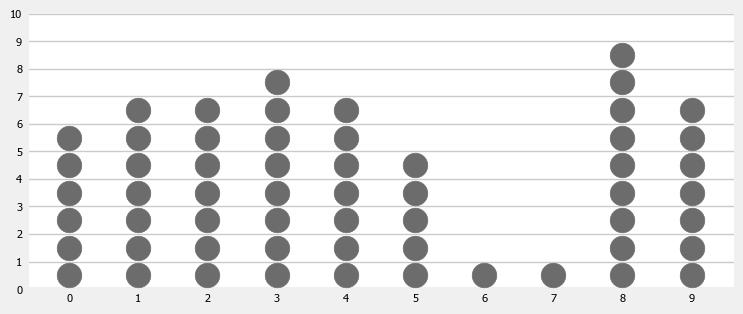

[{"x": "0", "y": 6}, {"x": "1", "y": 7}, {"x": "2", "y": 7}, {"x": "3", "y": 8}, {"x": "4", "y": 7}, {"x": "5", "y": 5}, {"x": "6", "y": 1}, {"x": "7", "y": 1}, {"x": "8", "y": 9}, {"x": "9", "y": 7}]


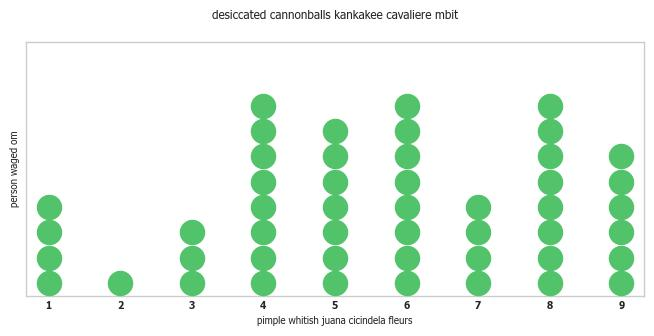

[{"x": "1", "y": 1}, {"x": "2", "y": 2}, {"x": "3", "y": 1}, {"x": "4", "y": 16}, {"x": "5", "y": 16}, {"x": "6", "y": 16}, {"x": "7", "y": 16}, {"x": "8", "y": 16}, {"x": "9", "y": 16}]


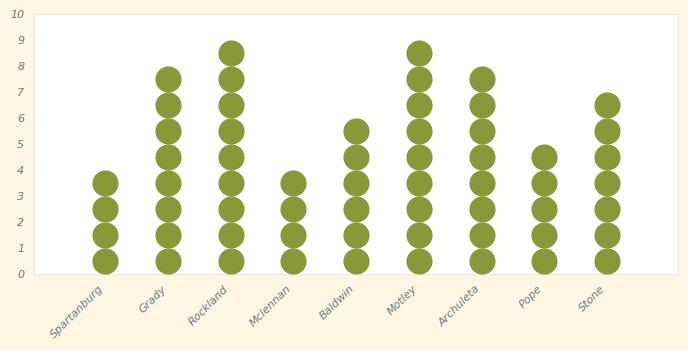

[{"x": "Smartanburg", "y": 4}, {"x": "Grady", "y": 8}, {"x": "Rockland", "y": 9}, {"x": "McLennan", "y": 4}, {"x": "Baldwin", "y": 6}, {"x": "Motey", "y": 9}, {"x": "Archuleta", "y": 8}, {"x": "Pope", "y": 5}, {"x": "Glone", "y": 7}]


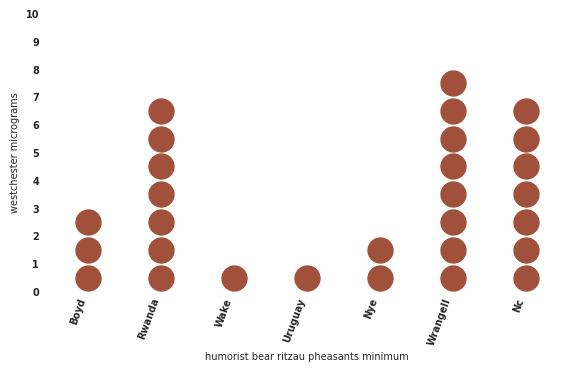

[{"x": "Moyd", "y": 3}, {"x": "Rhadda", "y": 7}, {"x": "Wice", "y": 1}, {"x": "Uruguay", "y": 1}, {"x": "Nine", "y": 2}, {"x": "Wangeli", "y": 8}, {"x": "Nif", "y": 7}]


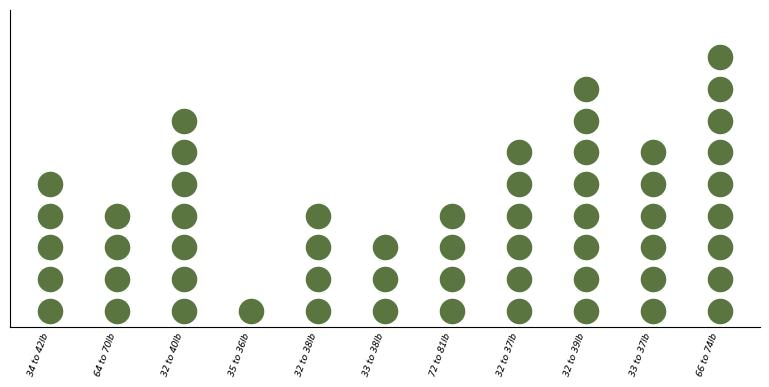

[{"x": "320-208", "y": 32}, {"x": "320-208", "y": 32}, {"x": "320-208", "y": 32}, {"x": "320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-208", "y": 320-209", "y": 321-209", "y": 322-209", "y": 323-209", "y": 324-209", "y": 325-209", "y": 326-209", "y": 327-209", "y": 328-209", "y": 329-209", "y": 326-209", "y": 327-209", "y": 329-209", "y": 326-209", "y": 327-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 329-209", "y": 326-209", "y": 326-209", "

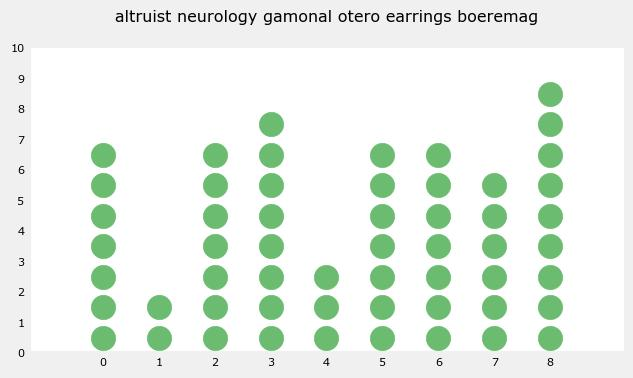

[{"x": "0", "y": 7}, {"x": "1", "y": 2}, {"x": "2", "y": 7}, {"x": "3", "y": 8}, {"x": "4", "y": 3}, {"x": "5", "y": 7}, {"x": "6", "y": 7}, {"x": "7", "y": 6}, {"x": "8", "y": 9}]


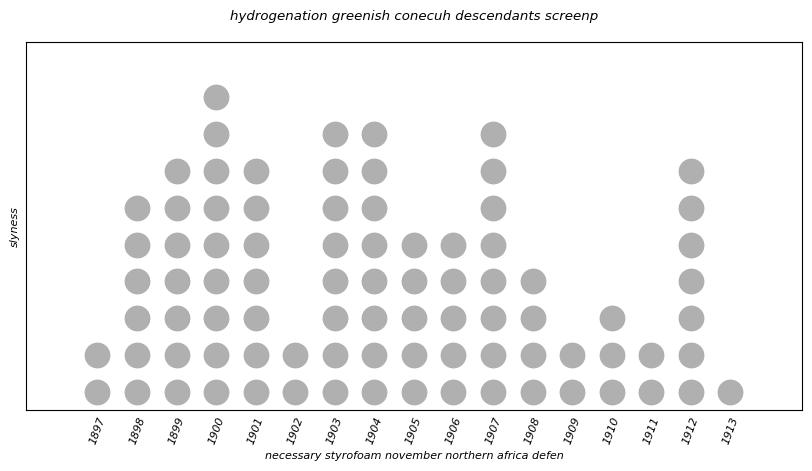

[{"x": "1997", "y": 6}, {"x": "1998", "y": 6}, {"x": "1999", "y": 6}, {"x": "1990", "y": 9}, {"x": "1991", "y": 6}, {"x": "1992", "y": 6}, {"x": "1993", "y": 6}, {"x": "1994", "y": 6}, {"x": "1995", "y": 6}, {"x": "1996", "y": 6}, {"x": "1998", "y": 6}, {"x": "1999", "y": 5}, {"x": "1999", "y": 6}, {"x": "1997", "y": 6}, {"x": "1998", "y": 6}, {"x": "1999", "y": 5}, {"x": "1999", "y": 6}, {"x": "1999", "y": 6}, {"x": "1990", "y": 6}, {"x": "1991", "y": 6}, {"x": "1992", "y": 6}]


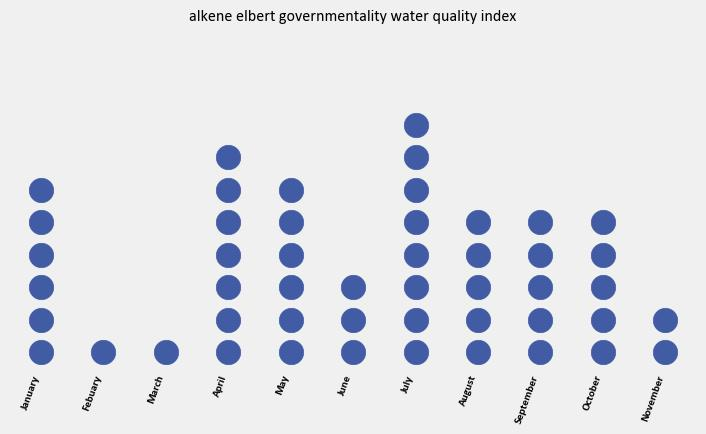

[{"x": "Jamaic", "y": 6}, {"x": "Kennedy", "y": 6}, {"x": "Mache", "y": 6}, {"x": "Appli", "y": 9}, {"x": "Kennedy", "y": 9}, {"x": "Serve", "y": 9}, {"x": "Greece", "y": 9}, {"x": "Jeremy", "y": 9}]


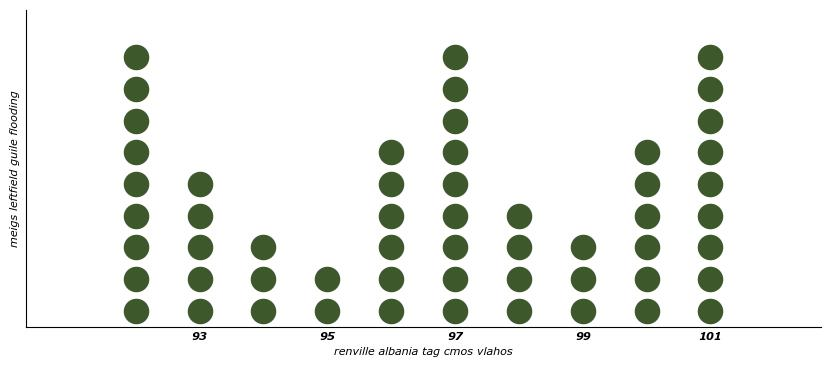

[{"x": "93", "y": 93}, {"x": "95", "y": 95}, {"x": "97", "y": 97}, {"x": "99", "y": 7}, {"x": "101", "y": 97}]


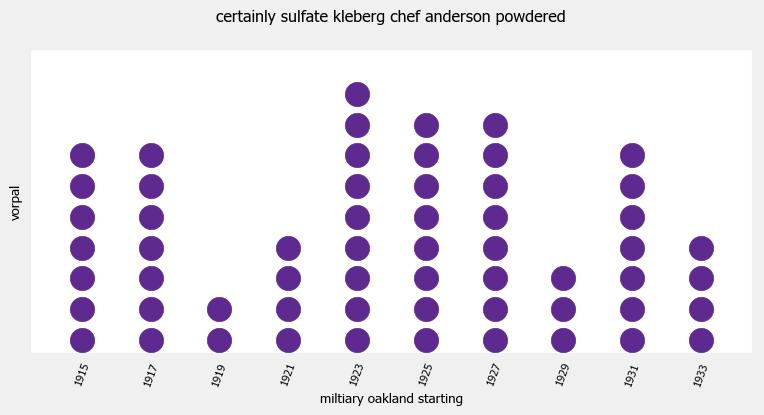

[{"x": "8915", "y": 36}, {"x": "892", "y": 36}, {"x": "893", "y": 36}, {"x": "894", "y": 36}, {"x": "895", "y": 36}]


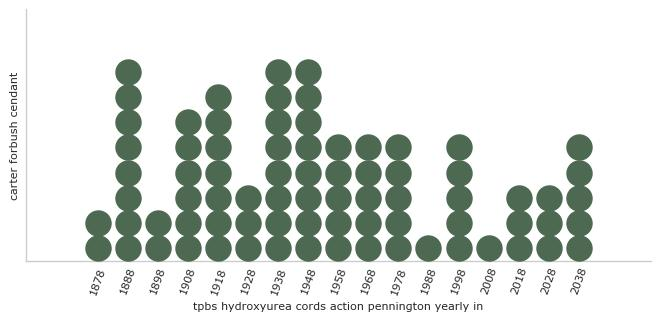

[{"x": "1978", "y": 2}, {"x": "1979", "y": 3}, {"x": "1980", "y": 3}, {"x": "1981", "y": 3}, {"x": "1982", "y": 3}, {"x": "1983", "y": 3}, {"x": "1984", "y": 3}, {"x": "1985", "y": 3}, {"x": "1986", "y": 3}, {"x": "1987", "y": 3}, {"x": "1988", "y": 3}, {"x": "2009", "y": 3}, {"x": "2019", "y": 3}, {"x": "2030", "y": 3}]


In [6]:
print("start loop:")
for i in range(84360, 84401):
    image_path = f"/kaggle/input/benetech-extra-generated-data/graphs_d/{i}.jpg"
    try:
        image = Image.open(image_path)
        display(image)
        inputs = processor(images=image, text="Generate data series:", return_tensors="pt")
        
        # Move inputs to GPU
        inputs = {key: value.to(device) for key, value in inputs.items()}
        
        predictions = model.generate(**inputs, max_new_tokens=2048)
        print(processor.decode(predictions[0], skip_special_tokens=True))
    except FileNotFoundError:
        print(f"Image not found: {image_path}")
    except Exception as e:
        print(f"Error processing {image_path}: {e}")

In [7]:
from transformers import AutoProcessor, Pix2StructForConditionalGeneration, Seq2SeqTrainer, Seq2SeqTrainingArguments
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
import pandas as pd
import json
import os
import torch

# Set CUDA environment variable to avoid memory fragmentation
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

class CSVChartDataset(Dataset):
    def __init__(self, images_dir, annotations_csv, processor):
        self.images_dir = images_dir
        self.annotations = pd.read_csv(annotations_csv)
        self.processor = processor

    def __len__(self):
        return min(1000, len(self.annotations))  # Use only 1000 images for fine-tuning

    def __getitem__(self, idx):
        row = self.annotations.iloc[idx]
        image_path = os.path.join(self.images_dir, os.path.basename(row["file_name"]))
        data_series = row["text"]

        # Convert the data-series to JSON-like format
        data_series_json = []
        for pair in data_series.split("<0x0A>"):
            if "|" in pair:
                x, y = pair.split("|")
                data_series_json.append({"x": x.strip(), "y": float(y.strip())})

        # Load image
        image = Image.open(image_path).convert("RGB")

        # Preprocess the image and data series
        inputs = self.processor(images=image, text="Generate data series:", return_tensors="pt")

        return {
            "flattened_patches": inputs["flattened_patches"].squeeze(),
            "labels": torch.tensor(
                self.processor.tokenizer(
                    json.dumps(data_series_json, ensure_ascii=False),
                    padding="max_length",
                    max_length=512,
                    truncation=True
                ).input_ids
            )
        }

# Custom data collator
def custom_data_collator(features):
    flattened_patches = torch.stack([feature["flattened_patches"] for feature in features])
    labels = torch.nn.utils.rnn.pad_sequence([feature["labels"] for feature in features], batch_first=True, padding_value=-100)
    return {"flattened_patches": flattened_patches, "labels": labels}

# Paths to your data directories
images_dir = "/kaggle/input/benetech-extra-generated-data/graphs_d"
annotations_csv = "/kaggle/input/benetech-extra-generated-data/metadata.csv"

# Load processor and model
model = Pix2StructForConditionalGeneration.from_pretrained("/kaggle/working/deplot_dot_finetuned")  # Load previously fine-tuned model
processor = AutoProcessor.from_pretrained("/kaggle/working/deplot_dot_finetuned")

# Prepare dataset
dataset = CSVChartDataset(images_dir, annotations_csv, processor)

# Split dataset into training and evaluation
train_size = int(0.8 * len(dataset))
eval_size = len(dataset) - train_size
train_dataset, eval_dataset = random_split(dataset, [train_size, eval_size])

# Training arguments
training_args = Seq2SeqTrainingArguments(
    output_dir="/kaggle/working/deplot_finetuned_v2",
    eval_strategy="epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=1,
    per_device_eval_batch_size=1,
    num_train_epochs=5,
    save_strategy="epoch",
    save_total_limit=2,
    predict_with_generate=True,
    fp16=True,
    logging_dir="/kaggle/working/logs_v2",
    logging_steps=100,
    push_to_hub=False,
    dataloader_num_workers=2,
    ddp_find_unused_parameters=False,
    report_to=["none"],
    gradient_accumulation_steps=2,
    no_cuda=False,
    load_best_model_at_end=True
)

# Initialize trainer
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    tokenizer=processor.tokenizer,
    data_collator=custom_data_collator
)

# Train model
trainer.train()

# Save the model
model.save_pretrained("/kaggle/working/deplot_dot_finetuned_v2")
processor.save_pretrained("/kaggle/working/deplot_dot_finetuned_v2")

<ipython-input-7-1ddf7bf29b9d>:97: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(
/usr/local/lib/python3.10/dist-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(


Epoch,Training Loss,Validation Loss
1,0.026600,0.017640
2,0.011500,0.015893
3,0.006900,0.015405
4,0.002700,0.016183
5,0.001100,0.015683


/usr/local/lib/python3.10/dist-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked t

[]

In [8]:
from torch.utils.data import Dataset, DataLoader, random_split
import pandas as pd
import json
import os
import torch
from transformers import AutoProcessor, Pix2StructForConditionalGeneration
from PIL import Image


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the fine-tuned model and processor
model = Pix2StructForConditionalGeneration.from_pretrained("/kaggle/working/deplot_dot_finetuned_v2").to(device)
processor = AutoProcessor.from_pretrained("/kaggle/working/deplot_dot_finetuned_v2")

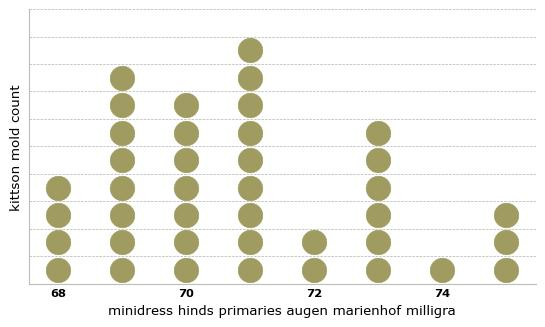

[{"x": "68", "y": 4.0}, {"x": "69", "y": 8.0}, {"x": "70", "y": 7.0}, {"x": "71", "y": 9.0}, {"x": "72", "y": 2.0}, {"x": "73", "y": 6.0}, {"x": "74", "y": 1.0}, {"x": "75", "y": 3.0}]


In [9]:
# Load an example image for prediction
image_path = "/kaggle/input/benetech-extra-generated-data/graphs_d/84359.jpg"
image = Image.open(image_path)
display(image)

inputs = processor(images=image, text="Generate data series:", return_tensors="pt")

# Move inputs to GPU
inputs = {key: value.to(device) for key, value in inputs.items()}

predictions = model.generate(**inputs, max_new_tokens=2048)
print(processor.decode(predictions[0], skip_special_tokens=True))

start loop:


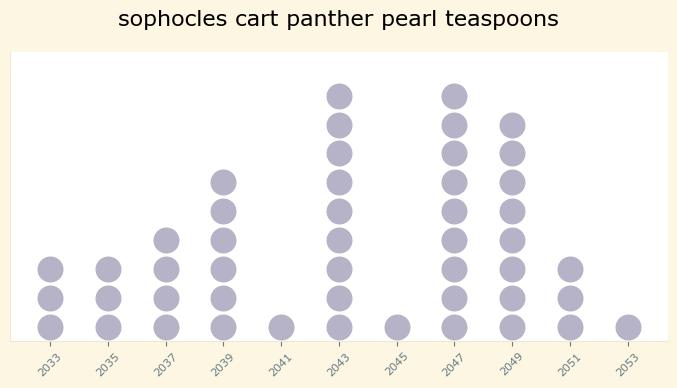

[{"x": "2033", "y": 3.0}, {"x": "2035", "y": 3.0}, {"x": "2037", "y": 4.0}, {"x": "2039", "y": 6.0}, {"x": "2041", "y": 1.0}, {"x": "2043", "y": 9.0}, {"x": "2045", "y": 1.0}, {"x": "2047", "y": 9.0}, {"x": "2049", "y": 8.0}, {"x": "2051", "y": 3.0}, {"x": "2053", "y": 1.0}]


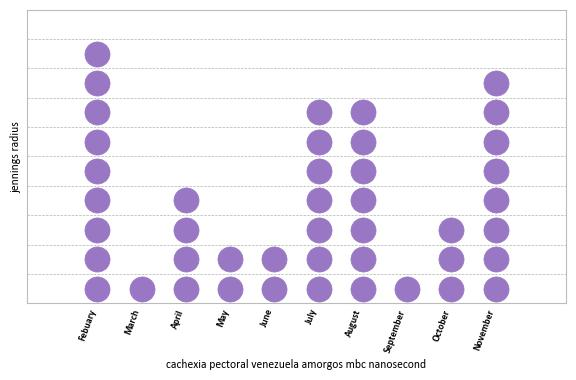

[{"x": "Febuary", "y": 9.0}, {"x": "March", "y": 1.0}, {"x": "April", "y": 4.0}, {"x": "May", "y": 2.0}, {"x": "June", "y": 2.0}, {"x": "July", "y": 7.0}, {"x": "August", "y": 7.0}, {"x": "September", "y": 1.0}, {"x": "October", "y": 3.0}, {"x": "November", "y": 8.0}]


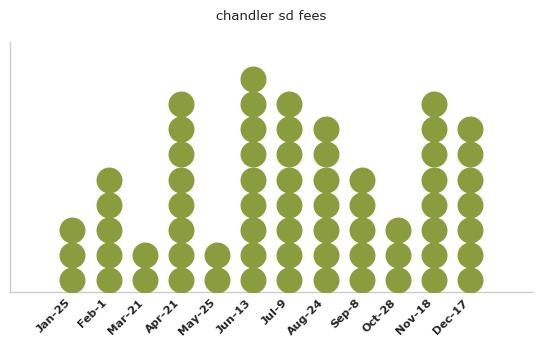

[{"x": "Jan-25", "y": 3.0}, {"x": "Feb-1", "y": 5.0}, {"x": "Mar-21", "y": 2.0}, {"x": "Apr-21", "y": 8.0}, {"x": "May-25", "y": 2.0}, {"x": "Jun-13", "y": 9.0}, {"x": "Jul-9", "y": 8.0}, {"x": "Aug-24", "y": 7.0}, {"x": "Sep-8", "y": 5.0}, {"x": "Oct-28", "y": 3.0}, {"x": "Nov-18", "y": 8.0}, {"x": "Dec-17", "y": 7.0}]


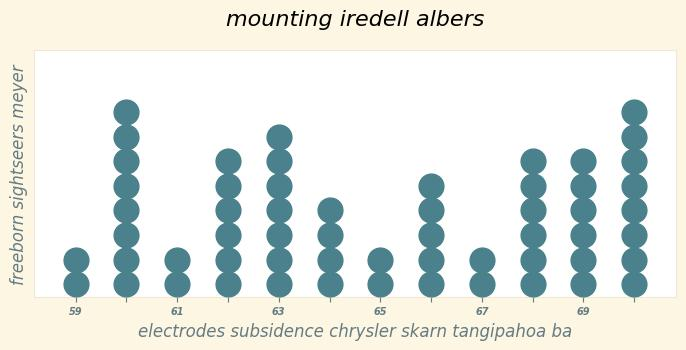

[{"x": "59", "y": 2.0}, {"x": "60", "y": 8.0}, {"x": "61", "y": 2.0}, {"x": "62", "y": 6.0}, {"x": "63", "y": 7.0}, {"x": "64", "y": 4.0}, {"x": "65", "y": 2.0}, {"x": "66", "y": 5.0}, {"x": "67", "y": 2.0}, {"x": "68", "y": 6.0}, {"x": "69", "y": 6.0}, {"x": "100", "y": 8.0}]


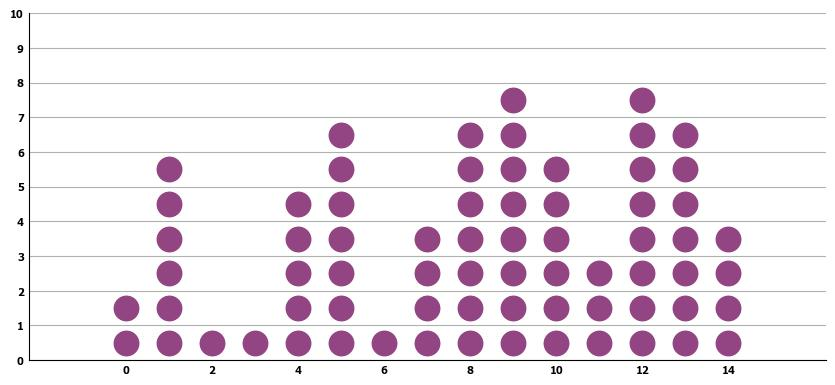

[{"x": "0", "y": 2.0}, {"x": "1", "y": 6.0}, {"x": "2", "y": 1.0}, {"x": "3", "y": 1.0}, {"x": "4", "y": 5.0}, {"x": "5", "y": 7.0}, {"x": "6", "y": 1.0}, {"x": "7", "y": 4.0}, {"x": "8", "y": 7.0}, {"x": "9", "y": 8.0}, {"x": "10", "y": 6.0}, {"x": "11", "y": 3.0}, {"x": "12", "y": 8.0}, {"x": "13", "y": 7.0}, {"x": "14", "y": 4.0}]


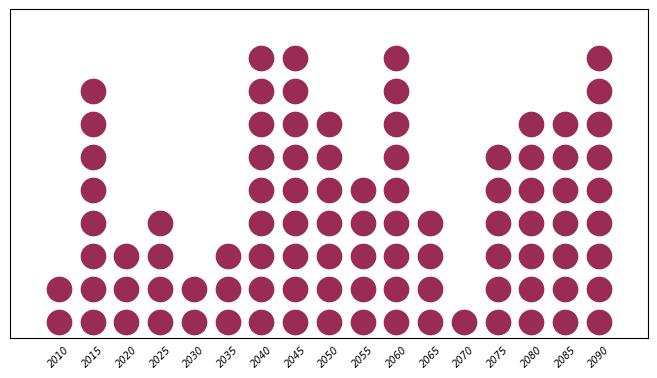

[{"x": "2010", "y": 2.0}, {"x": "2015", "y": 8.0}, {"x": "2020", "y": 3.0}, {"x": "2025", "y": 4.0}, {"x": "2030", "y": 2.0}, {"x": "2035", "y": 3.0}, {"x": "2040", "y": 9.0}, {"x": "2045", "y": 9.0}, {"x": "2050", "y": 7.0}, {"x": "2055", "y": 5.0}, {"x": "2060", "y": 9.0}, {"x": "2065", "y": 4.0}, {"x": "2070", "y": 1.0}, {"x": "2075", "y": 6.0}, {"x": "2080", "y": 7.0}, {"x": "2085", "y": 7.0}, {"x": "2090", "y": 9.0}]


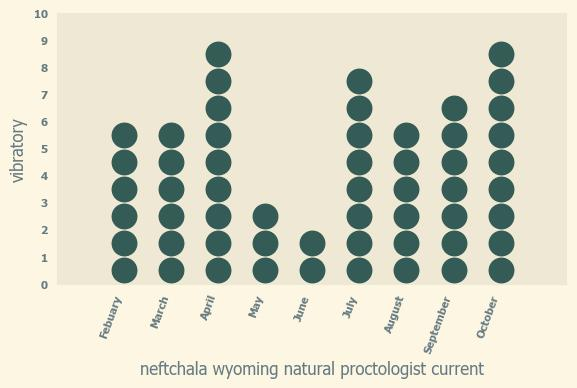

[{"x": "Febuary", "y": 6.0}, {"x": "March", "y": 6.0}, {"x": "April", "y": 9.0}, {"x": "May", "y": 3.0}, {"x": "June", "y": 2.0}, {"x": "July", "y": 8.0}, {"x": "August", "y": 6.0}, {"x": "September", "y": 7.0}, {"x": "October", "y": 9.0}]


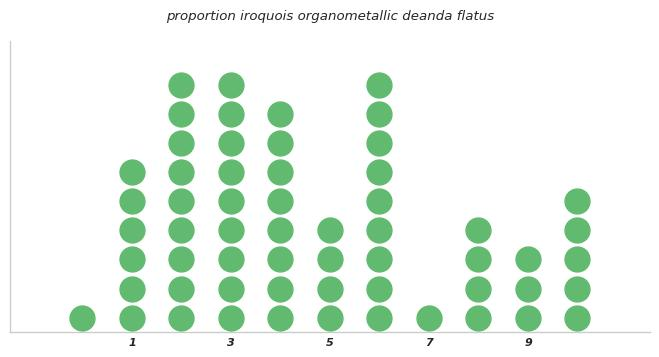

[{"x": "0", "y": 1.0}, {"x": "1", "y": 6.0}, {"x": "2", "y": 9.0}, {"x": "3", "y": 9.0}, {"x": "4", "y": 8.0}, {"x": "5", "y": 4.0}, {"x": "6", "y": 9.0}, {"x": "7", "y": 1.0}, {"x": "8", "y": 4.0}, {"x": "9", "y": 3.0}, {"x": "10", "y": 5.0}]


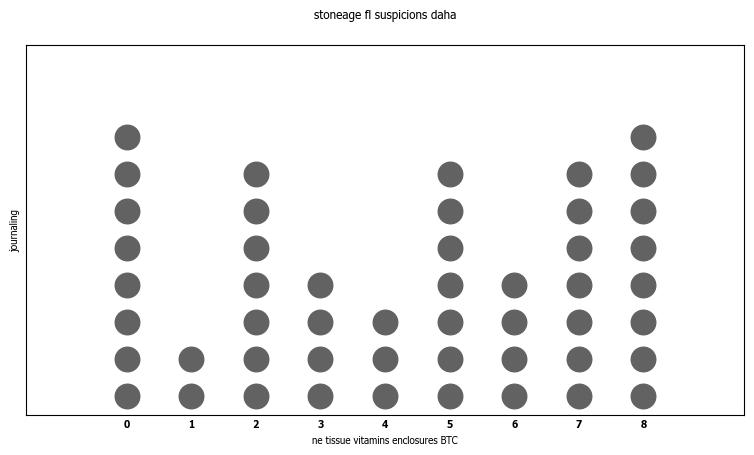

[{"x": "0", "y": 8.0}, {"x": "1", "y": 2.0}, {"x": "2", "y": 7.0}, {"x": "3", "y": 4.0}, {"x": "4", "y": 3.0}, {"x": "5", "y": 7.0}, {"x": "6", "y": 4.0}, {"x": "7", "y": 7.0}, {"x": "8", "y": 8.0}]


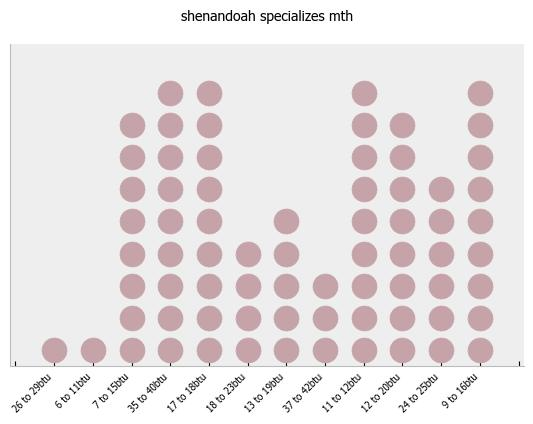

[{"x": "26 to 29btu", "y": 1.0}, {"x": "6 to 11btu", "y": 1.0}, {"x": "7 to 15btu", "y": 8.0}, {"x": "35 to 40btu", "y": 9.0}, {"x": "17 to 18btu", "y": 9.0}, {"x": "18 to 22btu", "y": 4.0}, {"x": "13 to 19btu", "y": 5.0}, {"x": "37 to 42btu", "y": 3.0}, {"x": "11 to 12btu", "y": 9.0}, {"x": "12 to 20btu", "y": 8.0}, {"x": "24 to 25btu", "y": 6.0}, {"x": "9 to 16btu", "y": 9.0}]


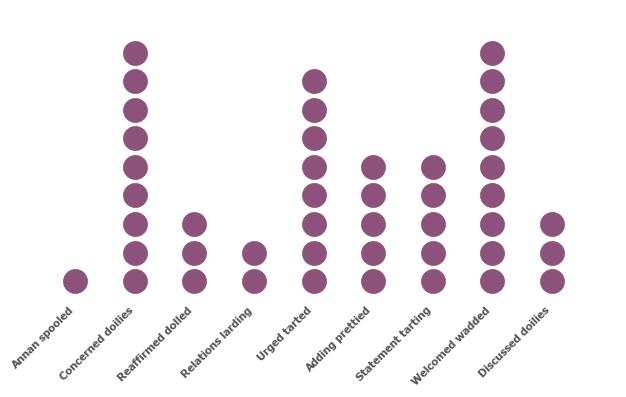

[{"x": "Annan spooled", "y": 1.0}, {"x": "Concerned dollies", "y": 9.0}, {"x": "Reaffirmed dolled", "y": 3.0}, {"x": "Relations landing", "y": 2.0}, {"x": "Urged tarted", "y": 8.0}, {"x": "Adding prettled", "y": 5.0}, {"x": "Statement tarting", "y": 5.0}, {"x": "Welcomed wadded", "y": 9.0}, {"x": "Discussed dollies", "y": 3.0}]


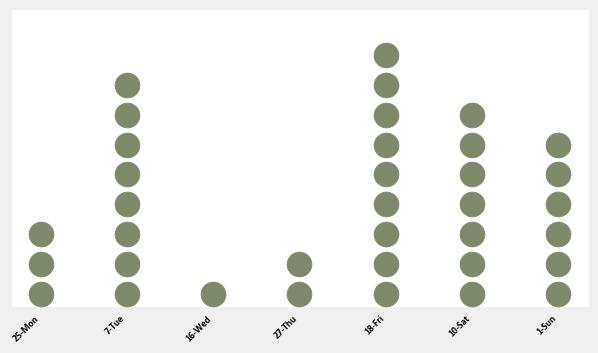

[{"x": "25-Mon", "y": 3.0}, {"x": "7-Tue", "y": 8.0}, {"x": "16-Wed", "y": 1.0}, {"x": "27-Thu", "y": 2.0}, {"x": "18-Fri", "y": 9.0}, {"x": "10-Sat", "y": 7.0}, {"x": "1-Sun", "y": 6.0}]


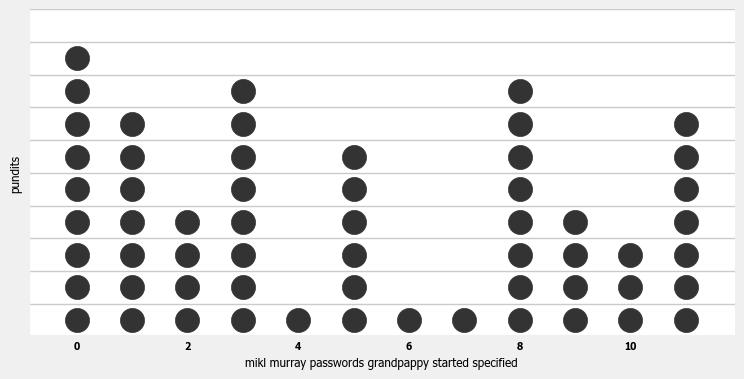

[{"x": "0", "y": 9.0}, {"x": "1", "y": 7.0}, {"x": "2", "y": 4.0}, {"x": "3", "y": 8.0}, {"x": "4", "y": 1.0}, {"x": "5", "y": 6.0}, {"x": "6", "y": 1.0}, {"x": "7", "y": 1.0}, {"x": "8", "y": 8.0}, {"x": "9", "y": 4.0}, {"x": "10", "y": 3.0}, {"x": "11", "y": 7.0}]


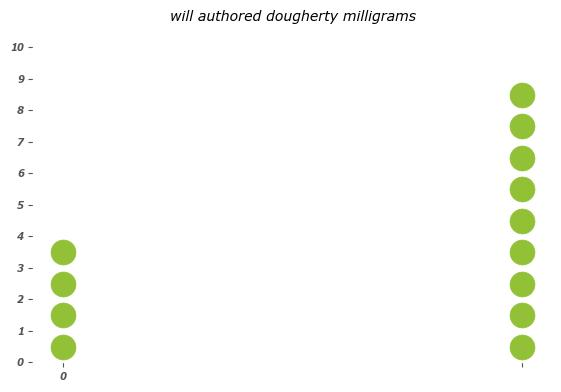

[{"x": "0", "y": 4.0}, {"x": "1", "y": 9.0}]


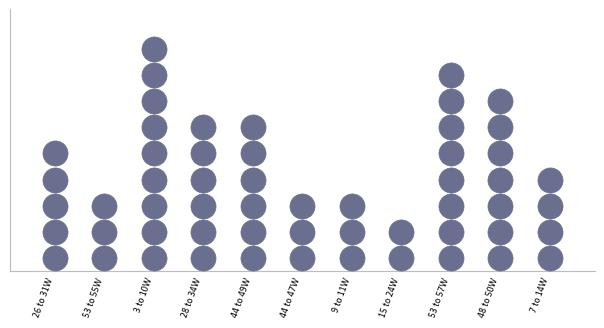

[{"x": "26 to 31W", "y": 5.0}, {"x": "53 to 55W", "y": 3.0}, {"x": "3 to 10W", "y": 9.0}, {"x": "28 to 34W", "y": 6.0}, {"x": "44 to 49W", "y": 6.0}, {"x": "44 to 47W", "y": 3.0}, {"x": "9 to 11W", "y": 3.0}, {"x": "15 to 24W", "y": 2.0}, {"x": "53 to 57W", "y": 8.0}, {"x": "48 to 50W", "y": 7.0}, {"x": "7 to 14W", "y": 4.0}]


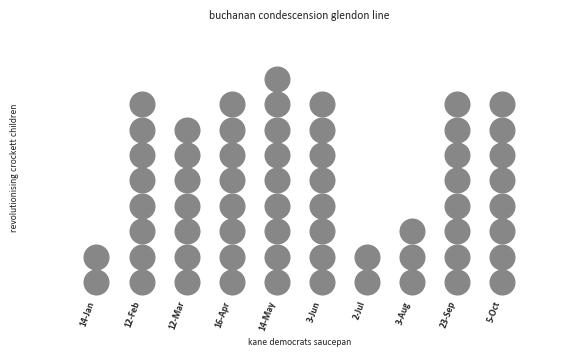

[{"x": "14-Jan", "y": 2.0}, {"x": "12-Feb", "y": 8.0}, {"x": "12-Mar", "y": 7.0}, {"x": "16-Apr", "y": 8.0}, {"x": "14-May", "y": 9.0}, {"x": "3-Jun", "y": 8.0}, {"x": "2-Jul", "y": 2.0}, {"x": "3-Aug", "y": 3.0}, {"x": "23-Sep", "y": 8.0}, {"x": "50-Oct", "y": 8.0}]


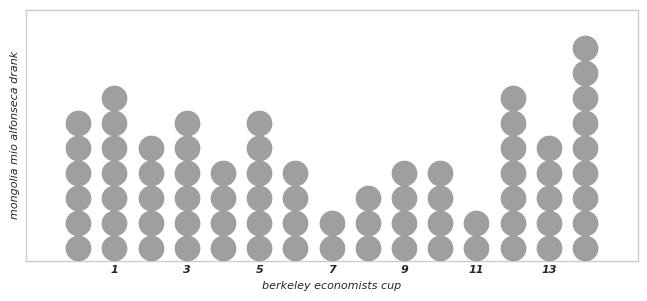

[{"x": "0", "y": 6.0}, {"x": "1", "y": 7.0}, {"x": "2", "y": 5.0}, {"x": "3", "y": 6.0}, {"x": "4", "y": 4.0}, {"x": "5", "y": 6.0}, {"x": "6", "y": 4.0}, {"x": "7", "y": 2.0}, {"x": "8", "y": 3.0}, {"x": "9", "y": 4.0}, {"x": "10", "y": 4.0}, {"x": "11", "y": 2.0}, {"x": "12", "y": 7.0}, {"x": "13", "y": 5.0}, {"x": "14", "y": 9.0}]


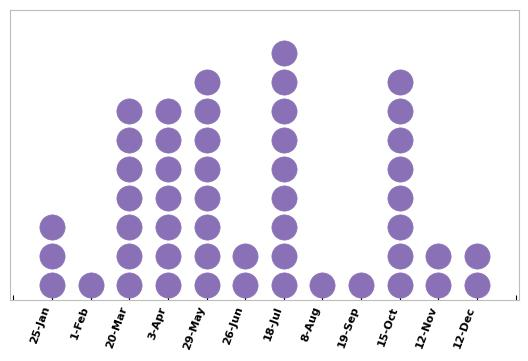

[{"x": "25-Jan", "y": 3.0}, {"x": "1-Feb", "y": 1.0}, {"x": "20-Mar", "y": 7.0}, {"x": "3-Apr", "y": 7.0}, {"x": "29-May", "y": 8.0}, {"x": "26-Jun", "y": 2.0}, {"x": "18-Jul", "y": 9.0}, {"x": "8-Aug", "y": 1.0}, {"x": "19-Sep", "y": 1.0}, {"x": "15-Oct", "y": 8.0}, {"x": "12-Nov", "y": 2.0}, {"x": "12-Dec", "y": 2.0}]


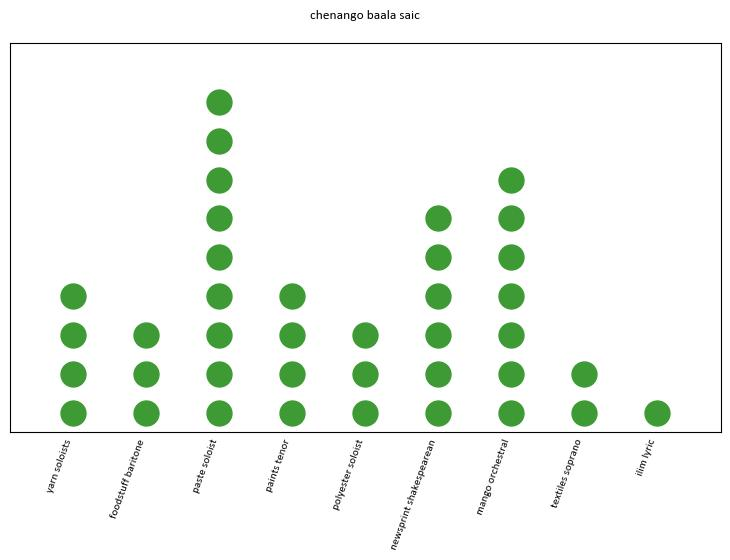

[{"x": "Aarn exisits", "y": 4.0}, {"x": "Foodstuff exitons", "y": 3.0}, {"x": "Black exitory", "y": 9.0}, {"x": "Burnt tans", "y": 4.0}, {"x": "Pellynette exitons", "y": 3.0}, {"x": "newpoint exutspauren", "y": 6.0}, {"x": "moose ricketra", "y": 7.0}, {"x": "treeless sprangs", "y": 2.0}, {"x": "8im lyrs", "y": 1.0}]


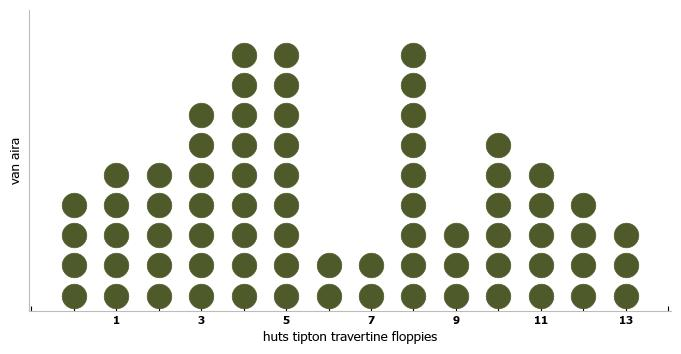

[{"x": "0", "y": 4.0}, {"x": "1", "y": 5.0}, {"x": "2", "y": 5.0}, {"x": "3", "y": 7.0}, {"x": "4", "y": 9.0}, {"x": "5", "y": 9.0}, {"x": "6", "y": 2.0}, {"x": "7", "y": 2.0}, {"x": "8", "y": 9.0}, {"x": "9", "y": 3.0}, {"x": "10", "y": 6.0}, {"x": "11", "y": 5.0}, {"x": "12", "y": 4.0}, {"x": "13", "y": 3.0}]


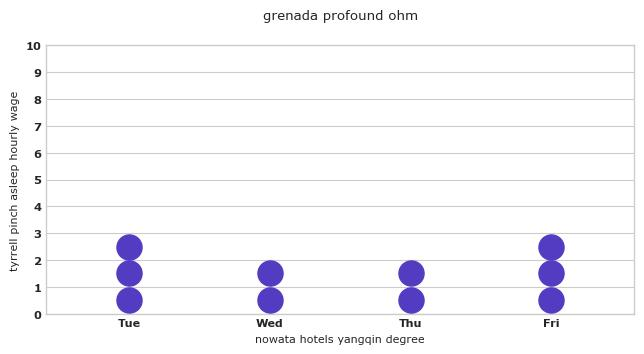

[{"x": "Tue", "y": 3.0}, {"x": "Wed", "y": 2.0}, {"x": "Thu", "y": 2.0}, {"x": "Fri", "y": 3.0}]


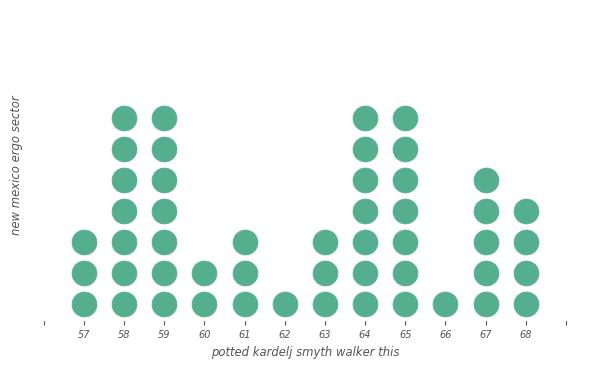

[{"x": "57", "y": 3.0}, {"x": "58", "y": 7.0}, {"x": "59", "y": 7.0}, {"x": "60", "y": 2.0}, {"x": "61", "y": 3.0}, {"x": "62", "y": 1.0}, {"x": "63", "y": 3.0}, {"x": "64", "y": 7.0}, {"x": "65", "y": 7.0}, {"x": "66", "y": 1.0}, {"x": "67", "y": 5.0}, {"x": "68", "y": 4.0}]


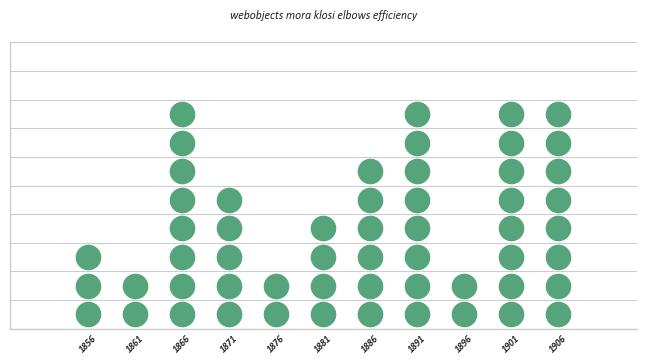

[{"x": "1866", "y": 3.0}, {"x": "1861", "y": 2.0}, {"x": "1866", "y": 8.0}, {"x": "1871", "y": 5.0}, {"x": "1876", "y": 2.0}, {"x": "1881", "y": 4.0}, {"x": "1886", "y": 6.0}, {"x": "1891", "y": 8.0}, {"x": "1896", "y": 2.0}, {"x": "1901", "y": 8.0}, {"x": "1906", "y": 8.0}]


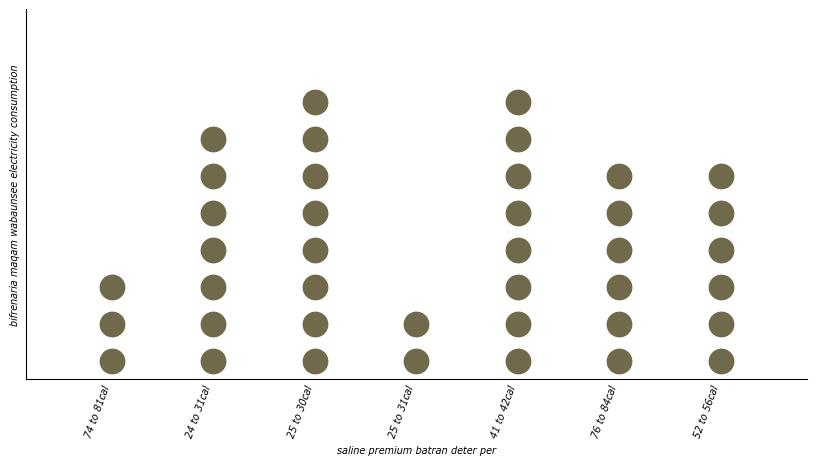

[{"x": "74 to 81cal", "y": 3.0}, {"x": "24 to 31cal", "y": 7.0}, {"x": "25 to 30cal", "y": 8.0}, {"x": "25 to 31cal", "y": 2.0}, {"x": "41 to 42cal", "y": 8.0}, {"x": "76 to 84cal", "y": 6.0}, {"x": "52 to 56cal", "y": 6.0}]


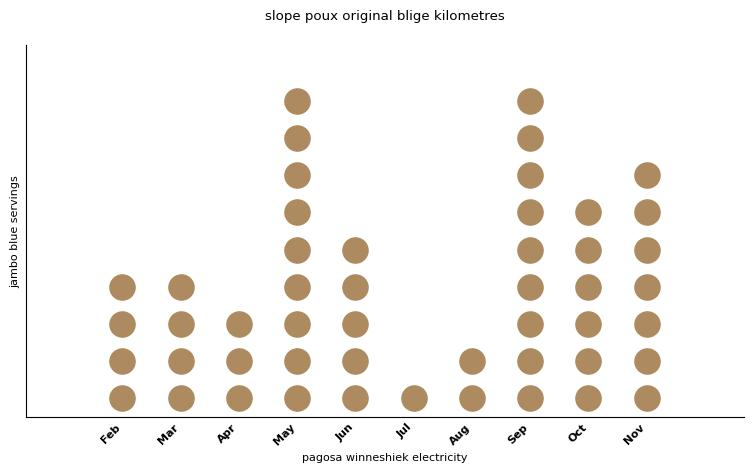

[{"x": "Feb", "y": 4.0}, {"x": "Mar", "y": 4.0}, {"x": "Apr", "y": 3.0}, {"x": "May", "y": 9.0}, {"x": "Jun", "y": 5.0}, {"x": "Jul", "y": 1.0}, {"x": "Aug", "y": 2.0}, {"x": "Sep", "y": 9.0}, {"x": "Oct", "y": 6.0}, {"x": "Nov", "y": 7.0}]


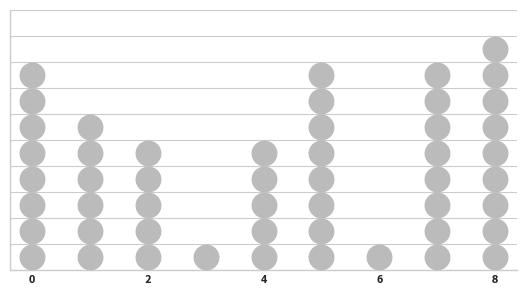

[{"x": "0", "y": 8.0}, {"x": "1", "y": 6.0}, {"x": "2", "y": 5.0}, {"x": "3", "y": 1.0}, {"x": "4", "y": 5.0}, {"x": "5", "y": 8.0}, {"x": "6", "y": 1.0}, {"x": "7", "y": 8.0}, {"x": "8", "y": 9.0}]


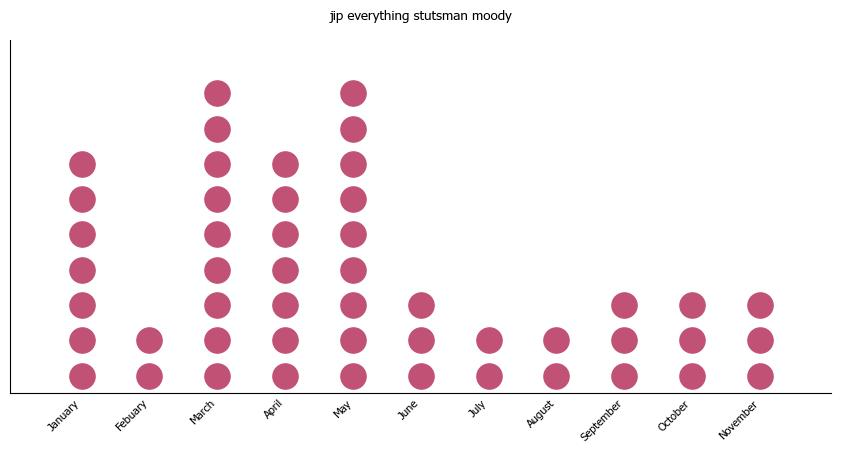

[{"x": "January", "y": 7.0}, {"x": "Febuary", "y": 2.0}, {"x": "March", "y": 9.0}, {"x": "April", "y": 7.0}, {"x": "May", "y": 9.0}, {"x": "June", "y": 3.0}, {"x": "July", "y": 2.0}, {"x": "August", "y": 2.0}, {"x": "September", "y": 3.0}, {"x": "October", "y": 3.0}, {"x": "November", "y": 3.0}]


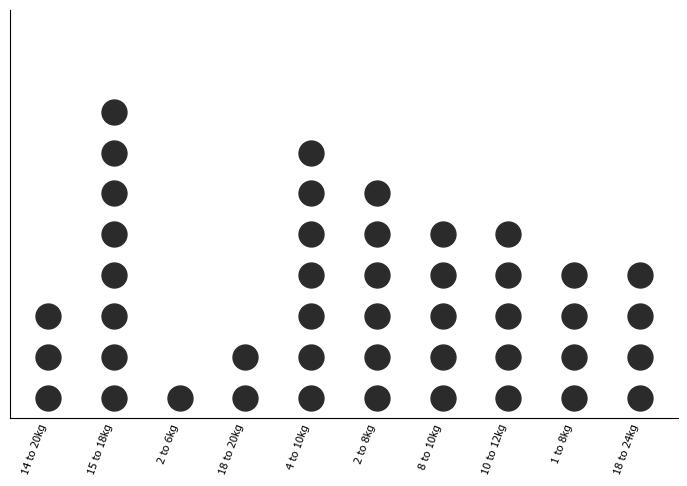

[{"x": "14 to 20kg", "y": 3.0}, {"x": "15 to 18kg", "y": 8.0}, {"x": "2 to 6kg", "y": 1.0}, {"x": "18 to 20kg", "y": 2.0}, {"x": "4 to 10kg", "y": 7.0}, {"x": "2 to 8kg", "y": 6.0}, {"x": "8 to 10kg", "y": 5.0}, {"x": "10 to 12kg", "y": 5.0}, {"x": "1 to 8kg", "y": 4.0}, {"x": "18 to 24kg", "y": 4.0}]


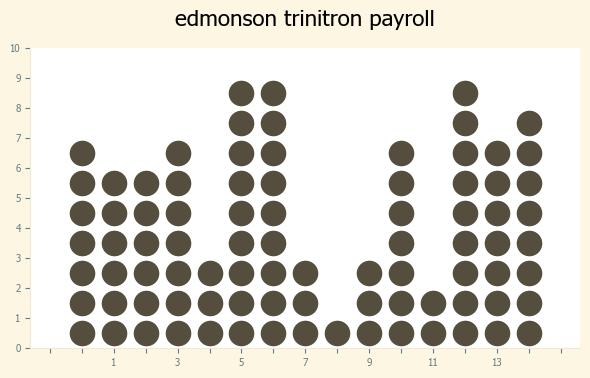

[{"x": "0", "y": 7.0}, {"x": "1", "y": 6.0}, {"x": "2", "y": 6.0}, {"x": "3", "y": 7.0}, {"x": "4", "y": 3.0}, {"x": "5", "y": 9.0}, {"x": "6", "y": 9.0}, {"x": "7", "y": 3.0}, {"x": "8", "y": 1.0}, {"x": "9", "y": 3.0}, {"x": "10", "y": 7.0}, {"x": "11", "y": 2.0}, {"x": "12", "y": 9.0}, {"x": "13", "y": 7.0}, {"x": "14", "y": 8.0}]


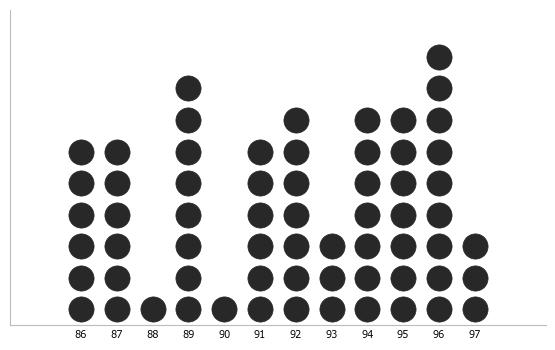

[{"x": "86", "y": 6.0}, {"x": "87", "y": 6.0}, {"x": "88", "y": 1.0}, {"x": "89", "y": 8.0}, {"x": "90", "y": 1.0}, {"x": "91", "y": 6.0}, {"x": "92", "y": 7.0}, {"x": "93", "y": 3.0}, {"x": "94", "y": 7.0}, {"x": "95", "y": 7.0}, {"x": "96", "y": 9.0}, {"x": "97", "y": 3.0}]


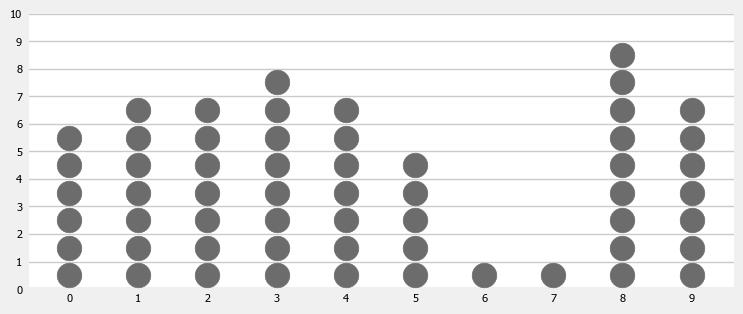

[{"x": "0", "y": 6.0}, {"x": "1", "y": 7.0}, {"x": "2", "y": 7.0}, {"x": "3", "y": 8.0}, {"x": "4", "y": 7.0}, {"x": "5", "y": 5.0}, {"x": "6", "y": 1.0}, {"x": "7", "y": 1.0}, {"x": "8", "y": 9.0}, {"x": "9", "y": 7.0}]


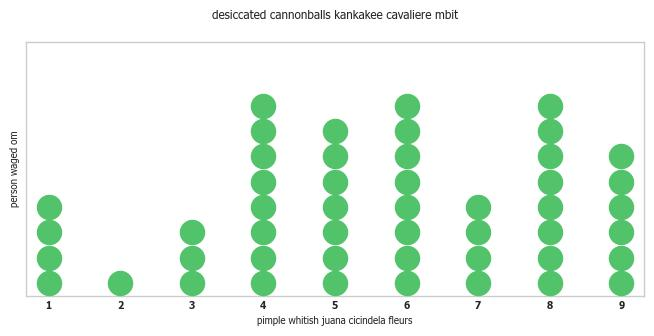

[{"x": "1", "y": 4.0}, {"x": "2", "y": 1.0}, {"x": "3", "y": 3.0}, {"x": "4", "y": 8.0}, {"x": "5", "y": 7.0}, {"x": "6", "y": 8.0}, {"x": "7", "y": 4.0}, {"x": "8", "y": 8.0}, {"x": "9", "y": 6.0}]


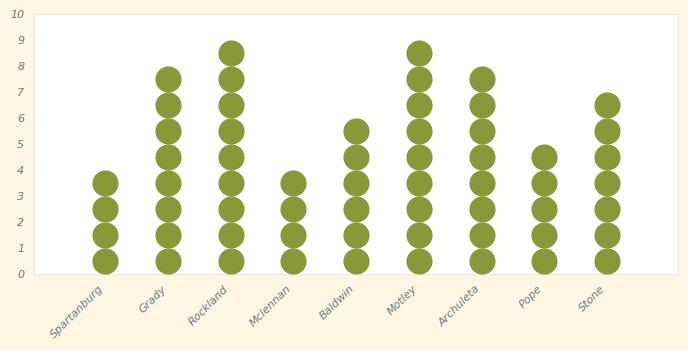

[{"x": "Smartanburg", "y": 4.0}, {"x": "Grady", "y": 8.0}, {"x": "Rockland", "y": 9.0}, {"x": "Mclennan", "y": 4.0}, {"x": "Baldwin", "y": 6.0}, {"x": "Mosley", "y": 9.0}, {"x": "Archuleta", "y": 8.0}, {"x": "Pope", "y": 5.0}, {"x": "Store", "y": 7.0}]


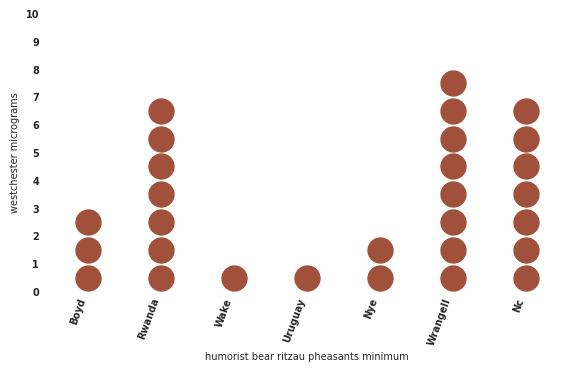

[{"x": "Boyd", "y": 3.0}, {"x": "Rwanda", "y": 7.0}, {"x": "Wake", "y": 1.0}, {"x": "Uruguay", "y": 1.0}, {"x": "Mye", "y": 2.0}, {"x": "Wrangell", "y": 8.0}, {"x": "Nc", "y": 7.0}]


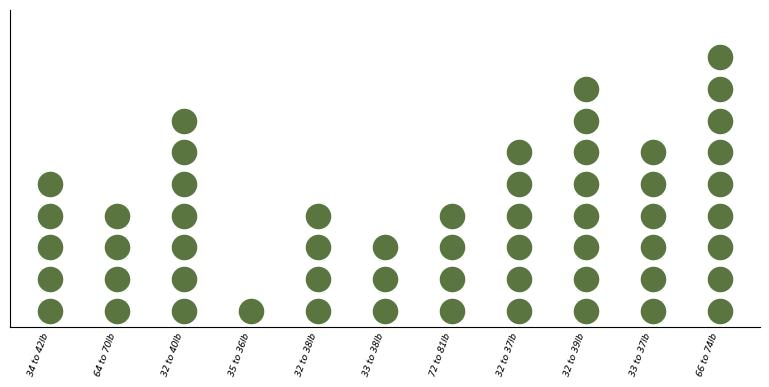

[{"x": "14 to 42b", "y": 5.0}, {"x": "64 to 70b", "y": 4.0}, {"x": "32 to 40b", "y": 7.0}, {"x": "35 to 36b", "y": 1.0}, {"x": "32 to 38b", "y": 4.0}, {"x": "33 to 38b", "y": 3.0}, {"x": "72 to 18b", "y": 4.0}, {"x": "32 to 37b", "y": 6.0}, {"x": "32 to 38b", "y": 8.0}, {"x": "33 to 37b", "y": 6.0}, {"x": "66 to 24b", "y": 9.0}]


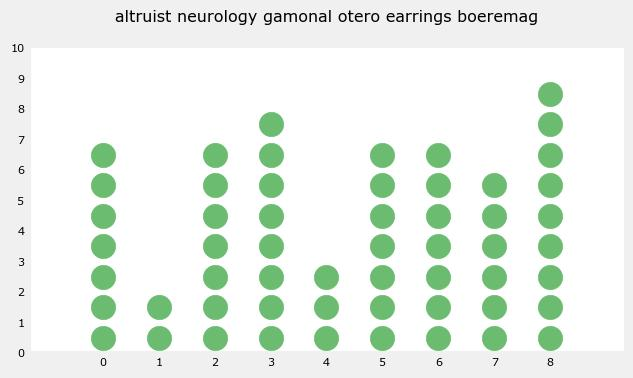

[{"x": "0", "y": 7.0}, {"x": "1", "y": 2.0}, {"x": "2", "y": 7.0}, {"x": "3", "y": 8.0}, {"x": "4", "y": 3.0}, {"x": "5", "y": 7.0}, {"x": "6", "y": 7.0}, {"x": "7", "y": 6.0}, {"x": "8", "y": 9.0}]


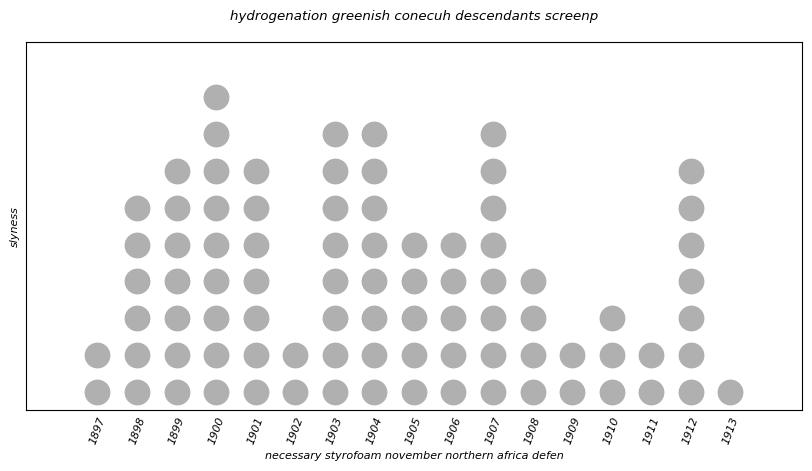

[{"x": "1897", "y": 2.0}, {"x": "1898", "y": 6.0}, {"x": "1899", "y": 7.0}, {"x": "1900", "y": 9.0}, {"x": "1901", "y": 7.0}, {"x": "1902", "y": 2.0}, {"x": "1903", "y": 8.0}, {"x": "1904", "y": 8.0}, {"x": "1905", "y": 5.0}, {"x": "1906", "y": 5.0}, {"x": "1907", "y": 8.0}, {"x": "1908", "y": 4.0}, {"x": "1909", "y": 2.0}, {"x": "1910", "y": 3.0}, {"x": "1911", "y": 2.0}, {"x": "1912", "y": 7.0}, {"x": "1913", "y": 1.0}]


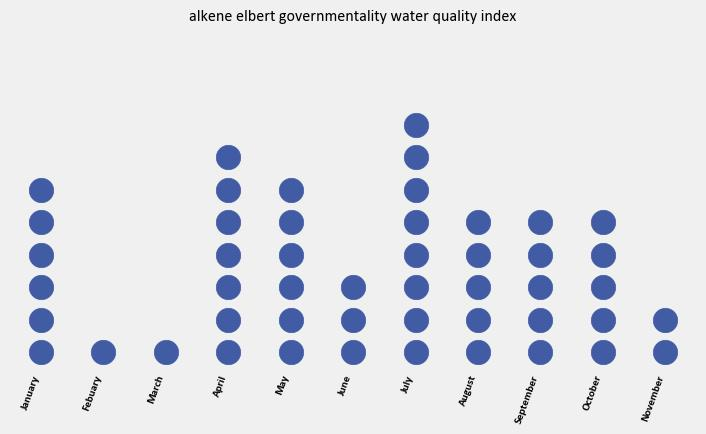

[{"x": "January", "y": 6.0}, {"x": "Febuary", "y": 1.0}, {"x": "March", "y": 1.0}, {"x": "April", "y": 8.0}, {"x": "May", "y": 6.0}, {"x": "June", "y": 3.0}, {"x": "July", "y": 9.0}, {"x": "August", "y": 5.0}, {"x": "September", "y": 5.0}, {"x": "October", "y": 5.0}, {"x": "November", "y": 2.0}]


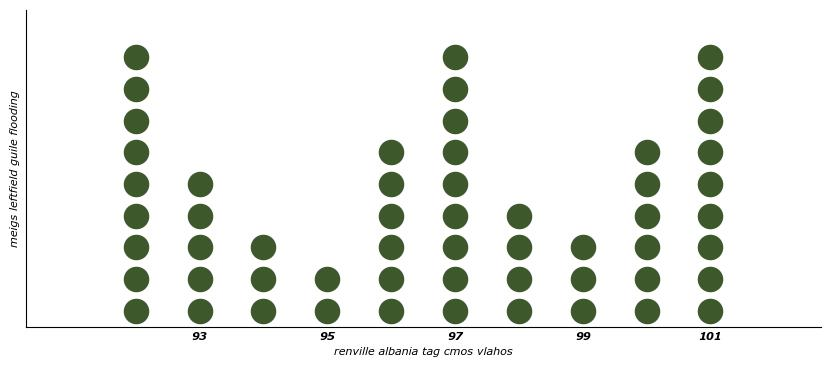

[{"x": "92", "y": 9.0}, {"x": "93", "y": 5.0}, {"x": "94", "y": 3.0}, {"x": "95", "y": 2.0}, {"x": "96", "y": 6.0}, {"x": "97", "y": 9.0}, {"x": "98", "y": 4.0}, {"x": "99", "y": 3.0}, {"x": "100", "y": 6.0}, {"x": "101", "y": 9.0}]


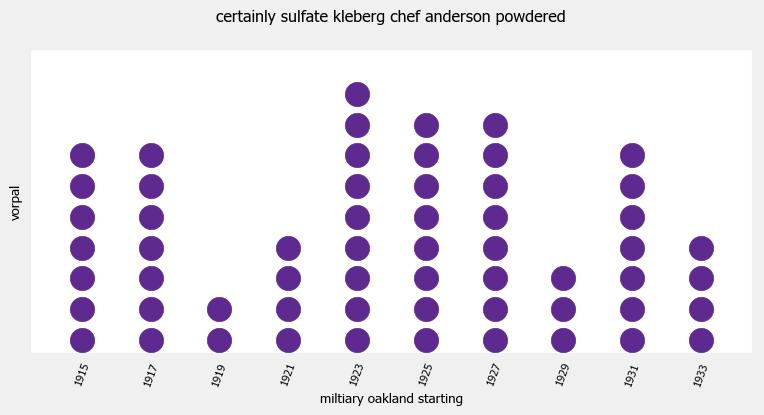

[{"x": "1915", "y": 7.0}, {"x": "1917", "y": 7.0}, {"x": "1919", "y": 2.0}, {"x": "1921", "y": 4.0}, {"x": "1923", "y": 9.0}, {"x": "1925", "y": 8.0}, {"x": "1927", "y": 8.0}, {"x": "1929", "y": 3.0}, {"x": "1931", "y": 7.0}, {"x": "1933", "y": 4.0}]


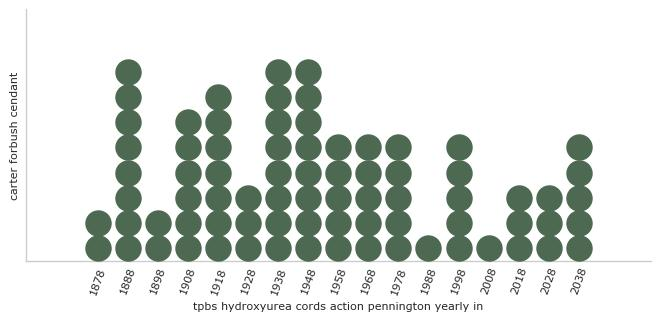

[{"x": "1878", "y": 2.0}, {"x": "1888", "y": 8.0}, {"x": "1898", "y": 2.0}, {"x": "1908", "y": 6.0}, {"x": "1918", "y": 7.0}, {"x": "1928", "y": 3.0}, {"x": "1938", "y": 8.0}, {"x": "1948", "y": 8.0}, {"x": "1958", "y": 5.0}, {"x": "1968", "y": 5.0}, {"x": "1978", "y": 5.0}, {"x": "1988", "y": 1.0}, {"x": "1998", "y": 5.0}, {"x": "2008", "y": 1.0}, {"x": "2018", "y": 3.0}, {"x": "2028", "y": 3.0}, {"x": "2038", "y": 5.0}]


In [10]:
print("start loop:")
for i in range(84360, 84401):
    image_path = f"/kaggle/input/benetech-extra-generated-data/graphs_d/{i}.jpg"
    try:
        image = Image.open(image_path)
        display(image)
        inputs = processor(images=image, text="Generate data series:", return_tensors="pt")
        
        # Move inputs to GPU
        inputs = {key: value.to(device) for key, value in inputs.items()}
        
        predictions = model.generate(**inputs, max_new_tokens=2048)
        print(processor.decode(predictions[0], skip_special_tokens=True))
    except FileNotFoundError:
        print(f"Image not found: {image_path}")
    except Exception as e:
        print(f"Error processing {image_path}: {e}")